<a href="https://colab.research.google.com/github/ziatdinovmax/atomai/blob/master/examples/notebooks/atomai_dkl_plasmons.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# DKL-GPR for active learning
This notebook demonstrates how to use a deep kernel learning (DKL)-based Gaussian process regression (GPR) for data reconstruction and automated experiments. We will be using the pre-acquired experimental dataset on plasmonic nanoparticles (HAADF + EELS) from Kevin Roccapriore.

*Prepared by Maxim Ziatdinov (August 2021)*

Intallations:

In [1]:
!pip install -q torch==1.8.1 torchvision==0.9.1 torchtext==0.9.1 torchaudio==0.8.1
!pip install -q git+https://github.com/pycroscopy/atomai.git

     |████████████████████████████████| 804.1 MB 2.8 kB/s 
     |████████████████████████████████| 17.4 MB 26.4 MB/s 
     |████████████████████████████████| 7.1 MB 33.9 MB/s 
     |████████████████████████████████| 1.9 MB 54.1 MB/s 
     |████████████████████████████████| 193 kB 8.3 MB/s 
     |████████████████████████████████| 503 kB 63.7 MB/s 
     |████████████████████████████████| 865 kB 58.0 MB/s 


Imports:

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import math

from scipy.signal import find_peaks
from sklearn.model_selection import train_test_split

import atomai as aoi

Download training data:

In [3]:
!wget -qq https://www.dropbox.com/s/1tguc2zraiyxg7h/Plasmonic_EELS_FITO0_edgehole_01.npy

Load data into the notebook:

In [4]:
loadedfile = np.load("Plasmonic_EELS_FITO0_edgehole_01.npy", allow_pickle=True).tolist()
for key, value in loadedfile.items():
  print(key, value.shape)

image (62, 75)
spectrum image (62, 75, 1496)
energy axis (1496,)
scale ()


In [5]:
img = loadedfile['image']
specim = loadedfile['spectrum image']
e_ax = loadedfile['energy axis']
imscale = loadedfile['scale']

Generate training inputs (image patches) and targets (spectra).

In [6]:
window_size = 12

coordinates = aoi.utils.get_coord_grid(img, step=1, return_dict=False)
features, targets, indices = aoi.utils.extract_patches_and_spectra(
    specim, img, coordinates=coordinates, window_size=window_size, avg_pool=16)

features.shape, targets.shape

((3264, 12, 12), (3264, 93))

Normalize data:

In [7]:
norm_ = lambda x: (x - x.min()) / x.ptp()
features, targets = norm_(features), norm_(targets)

Let's scalarize our vactor-valued targets. Here we are going to do the scalarization by simply using the intensity of largest plasmonic peak but more sophisticated scalar descritpors can be derived as well (ratio of peaks, etc.). First do it for a single spectrum:

25 0.7151328805097958


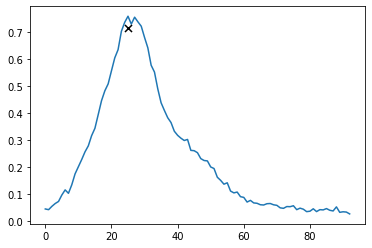

In [8]:
k = 1
peak_data = find_peaks(targets[k], width=5)
peak_pos, peak_int = peak_data[0][0], peak_data[1]['prominences'][0]
plt.plot(targets[k], zorder=0)
print(peak_pos, peak_int)
plt.scatter(peak_pos, peak_int, marker='x', s=50, c='k', zorder=1)

Same but for all the data:

In [9]:
peaks_all, features_all, indices_all = [], [], []
for i, t in enumerate(targets):
    peak = find_peaks(t, width=5)[1]["prominences"]
    if len(peak) == 0:
        continue
    peaks_all.append(np.array([peak[0]]) if len(peak) > 1 else peak)
    features_all.append(features[i])
    indices_all.append(indices[i])
peaks_all = np.concatenate(peaks_all)
features_all = np.array(features_all)
indices_all = np.array(indices_all)

Plot the scalarized target values for each feature coordinate:

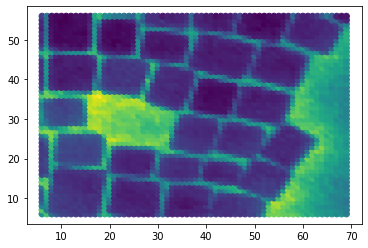

In [10]:
plt.scatter(indices_all[:, 1], indices_all[:, 0], c=peaks_all)

## DKL on full data

Prepare data for training:

In [11]:
n, d1, d2 = features_all.shape
X = features_all.reshape(n, d1*d2)
y = peaks_all
X.shape, y.shape

((3264, 144), (3264,))

Train:

In [12]:
data_dim = X.shape[-1]

dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
dklgp.fit(X, y, training_cycles=100)

Epoch 1/100 ... Training loss: 0.7581
Epoch 10/100 ... Training loss: 0.7123
Epoch 20/100 ... Training loss: 0.6735
Epoch 30/100 ... Training loss: 0.6348
Epoch 40/100 ... Training loss: 0.5954
Epoch 50/100 ... Training loss: 0.5549
Epoch 60/100 ... Training loss: 0.5134
Epoch 70/100 ... Training loss: 0.471
Epoch 80/100 ... Training loss: 0.4272
Epoch 90/100 ... Training loss: 0.3844
Epoch 100/100 ... Training loss: 0.3384


Make a "prediction" on the training data (since we used all the data for training, our training and test datasets are the same, that is, we basically look at how well our model was able to "fit" the data):

In [13]:
mean, var = dklgp.predict(X, batch_size=len(X))

Text(0.5, 1.0, 'DKL uncertainty')

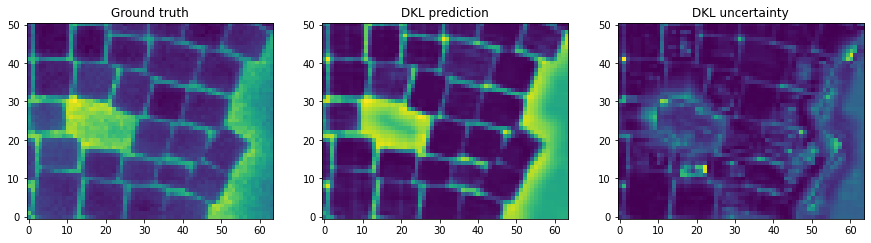

In [14]:
s1, s2 = img.shape[0] - window_size+1, img.shape[1] - window_size+1

_, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4.5))
ax1.imshow(peaks_all.reshape(s1, s2), origin="lower")
ax1.set_title("Ground truth")
ax2.imshow(mean.reshape(s1, s2))
ax2.set_title("DKL prediction")
ax2.imshow(mean.reshape(s1, s2), origin="lower")
ax3.imshow(var.reshape(s1, s2), origin="lower")
ax3.set_title("DKL uncertainty")

We can also visualize our latent/embedding space:

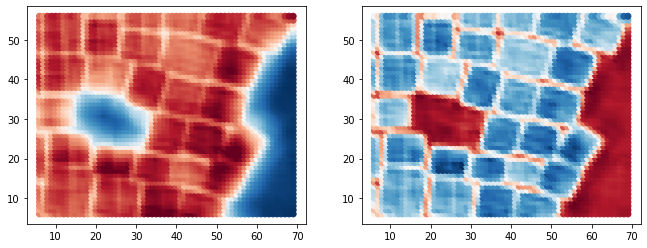

In [15]:
embeded = dklgp.embed(X)
embeded = embeded / embeded.max()

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 4))
ax1.scatter(indices_all[:, 1], indices_all[:, 0], c=embeded[:, 0], cmap='RdBu')
ax2.scatter(indices_all[:, 1], indices_all[:, 0], c=embeded[:, 1], cmap='RdBu')

## DKL on partial data

Now let's use only a part of the data for training:

In [16]:
split_ = 30
X_train = X[indices_all[:, 1] < split_]
y_train = y[indices_all[:, 1] < split_]
indices_train = indices_all[indices_all[:, 1] < split_]

In [17]:
dklgp1 = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
dklgp1.fit(X_train, y_train, training_cycles=100)

Epoch 1/100 ... Training loss: 0.768
Epoch 10/100 ... Training loss: 0.7272
Epoch 20/100 ... Training loss: 0.6866
Epoch 30/100 ... Training loss: 0.6481
Epoch 40/100 ... Training loss: 0.6064
Epoch 50/100 ... Training loss: 0.5645
Epoch 60/100 ... Training loss: 0.5183
Epoch 70/100 ... Training loss: 0.4775
Epoch 80/100 ... Training loss: 0.4319
Epoch 90/100 ... Training loss: 0.3884
Epoch 100/100 ... Training loss: 0.3418


Make a prediction on all the data:

In [18]:
mean, var = dklgp1.predict(X, batch_size=len(X))

Plot the prediction. The dotted vertical line divides the part used for training (left hand side) from the testing (right hand side) part.

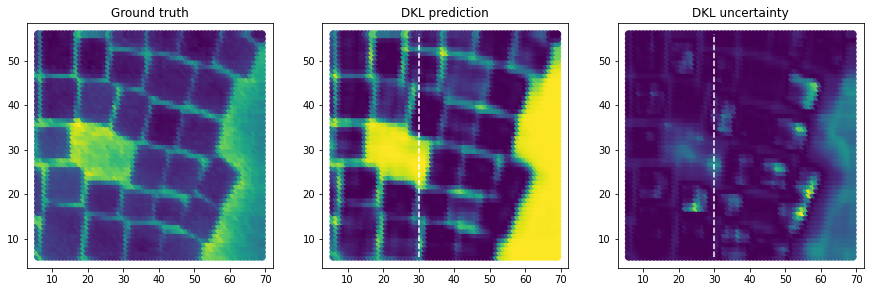

In [19]:
_, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4.5))
ax1.scatter(indices_all[:, 1], indices_all[:, 0], s=50, c=peaks_all)
ax1.set_title("Ground truth")
ax2.scatter(indices_all[:, 1], indices_all[:, 0], s=50, c=mean)
ax2.set_title("DKL prediction")
ax3.scatter(indices_all[:, 1], indices_all[:, 0], s=50, c=var)
ax3.set_title("DKL uncertainty")
ax2.vlines(split_, indices_all[:, 0].min(), indices_all[:, 0].max(), linestyle='--', color='w')
ax3.vlines(split_, indices_all[:, 0].min(), indices_all[:, 0].max(), linestyle='--', color='w')

## Active learning

Here we are going to use DKL for active learning aimed at identifying regions of the sample where a particular behavior (plasmon resonance peak) is maximized. We start with just three "measured" points:

In [30]:
# Here X_train and y_train are our measured image patches (HAADF) and spectra/peaks (EELS),
# whereas X_test and y_test are the "unkwown" ones. The indices_train are grid coordinates of the measured points,
# whereas the indices_test are the grid coordinates of the remaining available points on the grid
(X_train, X_test, y_train, y_test,
  indices_train, indices_test) = train_test_split(
      X, y, indices_all, test_size=0.999, shuffle=True, random_state=4)

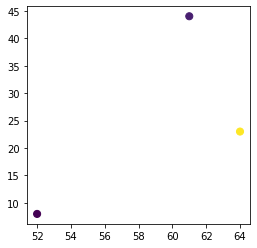

In [31]:
plt.figure(figsize=(4, 4))
plt.scatter(indices_train[:, 1], indices_train[:, 0], s=50, c=y_train)

Do sample exploration based on the pre-acquired data (i.e., we are running a "dummy" experiment):

1/100
Epoch 1/200 ... Training loss: 1.0305
Epoch 10/200 ... Training loss: 0.9912
Epoch 20/200 ... Training loss: 0.9114
Epoch 30/200 ... Training loss: 0.848
Epoch 40/200 ... Training loss: 0.7916
Epoch 50/200 ... Training loss: 0.7366
Epoch 60/200 ... Training loss: 0.684
Epoch 70/200 ... Training loss: 0.6338
Epoch 80/200 ... Training loss: 0.585
Epoch 90/200 ... Training loss: 0.5366
Epoch 100/200 ... Training loss: 0.4885
Epoch 110/200 ... Training loss: 0.4408
Epoch 120/200 ... Training loss: 0.3938
Epoch 130/200 ... Training loss: 0.3475
Epoch 140/200 ... Training loss: 0.302
Epoch 150/200 ... Training loss: 0.2577
Epoch 160/200 ... Training loss: 0.2146
Epoch 170/200 ... Training loss: 0.1729
Epoch 180/200 ... Training loss: 0.1327
Epoch 190/200 ... Training loss: 0.0942
Epoch 200/200 ... Training loss: 0.057


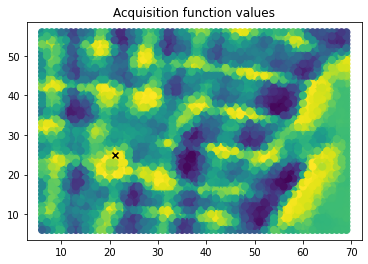

2/100
Epoch 1/200 ... Training loss: 1.0295
Epoch 10/200 ... Training loss: 0.9787
Epoch 20/200 ... Training loss: 0.9096
Epoch 30/200 ... Training loss: 0.854
Epoch 40/200 ... Training loss: 0.7967
Epoch 50/200 ... Training loss: 0.7418
Epoch 60/200 ... Training loss: 0.6888
Epoch 70/200 ... Training loss: 0.638
Epoch 80/200 ... Training loss: 0.5907
Epoch 90/200 ... Training loss: 0.5442
Epoch 100/200 ... Training loss: 0.4989
Epoch 110/200 ... Training loss: 0.4545
Epoch 120/200 ... Training loss: 0.4109
Epoch 130/200 ... Training loss: 0.3679
Epoch 140/200 ... Training loss: 0.3251
Epoch 150/200 ... Training loss: 0.2819
Epoch 160/200 ... Training loss: 0.239
Epoch 170/200 ... Training loss: 0.1885
Epoch 180/200 ... Training loss: 0.1479
Epoch 190/200 ... Training loss: 0.111
Epoch 200/200 ... Training loss: 0.0766


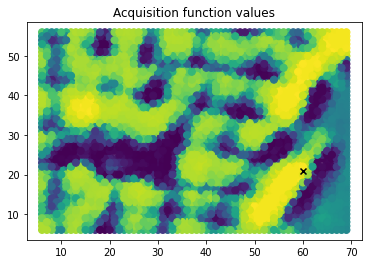

3/100
Epoch 1/200 ... Training loss: 0.9909
Epoch 10/200 ... Training loss: 0.9414
Epoch 20/200 ... Training loss: 0.8919
Epoch 30/200 ... Training loss: 0.8313
Epoch 40/200 ... Training loss: 0.7782
Epoch 50/200 ... Training loss: 0.7274
Epoch 60/200 ... Training loss: 0.6795
Epoch 70/200 ... Training loss: 0.6337
Epoch 80/200 ... Training loss: 0.5893
Epoch 90/200 ... Training loss: 0.5456
Epoch 100/200 ... Training loss: 0.5024
Epoch 110/200 ... Training loss: 0.4598
Epoch 120/200 ... Training loss: 0.4181
Epoch 130/200 ... Training loss: 0.3764
Epoch 140/200 ... Training loss: 0.3326
Epoch 150/200 ... Training loss: 0.2857
Epoch 160/200 ... Training loss: 0.2373
Epoch 170/200 ... Training loss: 0.1916
Epoch 180/200 ... Training loss: 0.1513
Epoch 190/200 ... Training loss: 0.1146
Epoch 200/200 ... Training loss: 0.08


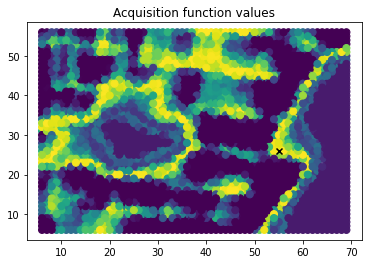

4/100
Epoch 1/200 ... Training loss: 0.9709
Epoch 10/200 ... Training loss: 0.9301
Epoch 20/200 ... Training loss: 0.8758
Epoch 30/200 ... Training loss: 0.823
Epoch 40/200 ... Training loss: 0.772
Epoch 50/200 ... Training loss: 0.7244
Epoch 60/200 ... Training loss: 0.6801
Epoch 70/200 ... Training loss: 0.6369
Epoch 80/200 ... Training loss: 0.5942
Epoch 90/200 ... Training loss: 0.5517
Epoch 100/200 ... Training loss: 0.5095
Epoch 110/200 ... Training loss: 0.4672
Epoch 120/200 ... Training loss: 0.425
Epoch 130/200 ... Training loss: 0.3831
Epoch 140/200 ... Training loss: 0.3416
Epoch 150/200 ... Training loss: 0.2989
Epoch 160/200 ... Training loss: 0.2545
Epoch 170/200 ... Training loss: 0.2095
Epoch 180/200 ... Training loss: 0.1716
Epoch 190/200 ... Training loss: 0.1364
Epoch 200/200 ... Training loss: 0.1033


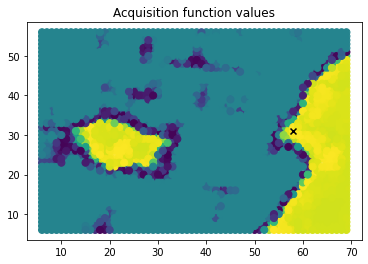

5/100
Epoch 1/200 ... Training loss: 0.9597
Epoch 10/200 ... Training loss: 0.9191
Epoch 20/200 ... Training loss: 0.8673
Epoch 30/200 ... Training loss: 0.8131
Epoch 40/200 ... Training loss: 0.7639
Epoch 50/200 ... Training loss: 0.7165
Epoch 60/200 ... Training loss: 0.6715
Epoch 70/200 ... Training loss: 0.628
Epoch 80/200 ... Training loss: 0.5851
Epoch 90/200 ... Training loss: 0.5421
Epoch 100/200 ... Training loss: 0.499
Epoch 110/200 ... Training loss: 0.4556
Epoch 120/200 ... Training loss: 0.4124
Epoch 130/200 ... Training loss: 0.3677
Epoch 140/200 ... Training loss: 0.3211
Epoch 150/200 ... Training loss: 0.2726
Epoch 160/200 ... Training loss: 0.2294
Epoch 170/200 ... Training loss: 0.1896
Epoch 180/200 ... Training loss: 0.1515
Epoch 190/200 ... Training loss: 0.1151
Epoch 200/200 ... Training loss: 0.0802


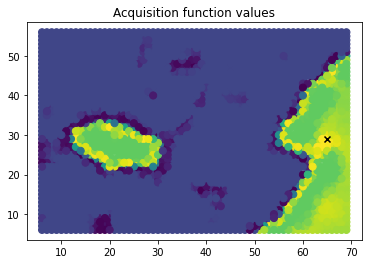

6/100
Epoch 1/200 ... Training loss: 0.9448
Epoch 10/200 ... Training loss: 0.9269
Epoch 20/200 ... Training loss: 0.8638
Epoch 30/200 ... Training loss: 0.8117
Epoch 40/200 ... Training loss: 0.7586
Epoch 50/200 ... Training loss: 0.708
Epoch 60/200 ... Training loss: 0.6601
Epoch 70/200 ... Training loss: 0.6142
Epoch 80/200 ... Training loss: 0.5693
Epoch 90/200 ... Training loss: 0.5246
Epoch 100/200 ... Training loss: 0.4797
Epoch 110/200 ... Training loss: 0.4344
Epoch 120/200 ... Training loss: 0.3888
Epoch 130/200 ... Training loss: 0.3437
Epoch 140/200 ... Training loss: 0.3019
Epoch 150/200 ... Training loss: 0.256
Epoch 160/200 ... Training loss: 0.2092
Epoch 170/200 ... Training loss: 0.1675
Epoch 180/200 ... Training loss: 0.128
Epoch 190/200 ... Training loss: 0.09
Epoch 200/200 ... Training loss: 0.0537


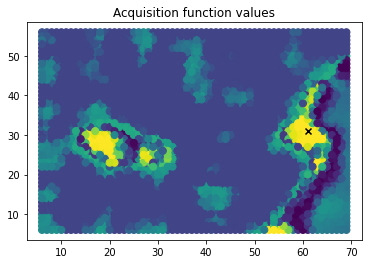

7/100
Epoch 1/200 ... Training loss: 0.9319
Epoch 10/200 ... Training loss: 0.9024
Epoch 20/200 ... Training loss: 0.8454
Epoch 30/200 ... Training loss: 0.7928
Epoch 40/200 ... Training loss: 0.7438
Epoch 50/200 ... Training loss: 0.6957
Epoch 60/200 ... Training loss: 0.6489
Epoch 70/200 ... Training loss: 0.6037
Epoch 80/200 ... Training loss: 0.5593
Epoch 90/200 ... Training loss: 0.5143
Epoch 100/200 ... Training loss: 0.4683
Epoch 110/200 ... Training loss: 0.421
Epoch 120/200 ... Training loss: 0.3725
Epoch 130/200 ... Training loss: 0.3254
Epoch 140/200 ... Training loss: 0.2806
Epoch 150/200 ... Training loss: 0.237
Epoch 160/200 ... Training loss: 0.1945
Epoch 170/200 ... Training loss: 0.1534
Epoch 180/200 ... Training loss: 0.1135
Epoch 190/200 ... Training loss: 0.075
Epoch 200/200 ... Training loss: 0.0378


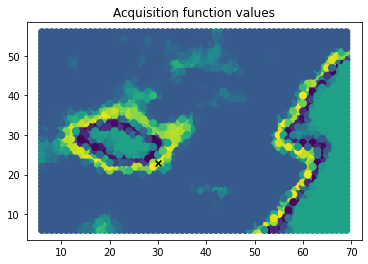

8/100
Epoch 1/200 ... Training loss: 0.9254
Epoch 10/200 ... Training loss: 0.8911
Epoch 20/200 ... Training loss: 0.837
Epoch 30/200 ... Training loss: 0.7879
Epoch 40/200 ... Training loss: 0.7378
Epoch 50/200 ... Training loss: 0.6897
Epoch 60/200 ... Training loss: 0.6431
Epoch 70/200 ... Training loss: 0.5975
Epoch 80/200 ... Training loss: 0.5523
Epoch 90/200 ... Training loss: 0.5073
Epoch 100/200 ... Training loss: 0.462
Epoch 110/200 ... Training loss: 0.4167
Epoch 120/200 ... Training loss: 0.3712
Epoch 130/200 ... Training loss: 0.3253
Epoch 140/200 ... Training loss: 0.2795
Epoch 150/200 ... Training loss: 0.2344
Epoch 160/200 ... Training loss: 0.1908
Epoch 170/200 ... Training loss: 0.1488
Epoch 180/200 ... Training loss: 0.1068
Epoch 190/200 ... Training loss: 0.0639
Epoch 200/200 ... Training loss: 0.0238


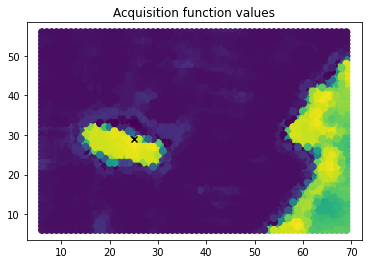

9/100
Epoch 1/200 ... Training loss: 0.9163
Epoch 10/200 ... Training loss: 0.8885
Epoch 20/200 ... Training loss: 0.8327
Epoch 30/200 ... Training loss: 0.8084
Epoch 40/200 ... Training loss: 0.7318
Epoch 50/200 ... Training loss: 0.683
Epoch 60/200 ... Training loss: 0.6355
Epoch 70/200 ... Training loss: 0.589
Epoch 80/200 ... Training loss: 0.5432
Epoch 90/200 ... Training loss: 0.4976
Epoch 100/200 ... Training loss: 0.452
Epoch 110/200 ... Training loss: 0.4065
Epoch 120/200 ... Training loss: 0.3612
Epoch 130/200 ... Training loss: 0.3164
Epoch 140/200 ... Training loss: 0.2729
Epoch 150/200 ... Training loss: 0.2287
Epoch 160/200 ... Training loss: 0.1822
Epoch 170/200 ... Training loss: 0.1374
Epoch 180/200 ... Training loss: 0.0934
Epoch 190/200 ... Training loss: 0.0513
Epoch 200/200 ... Training loss: 0.011


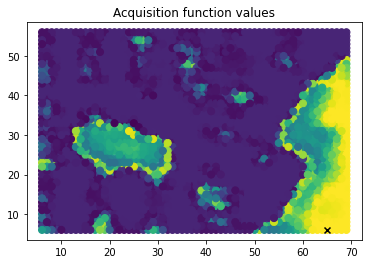

10/100
Epoch 1/200 ... Training loss: 0.9113
Epoch 10/200 ... Training loss: 0.8877
Epoch 20/200 ... Training loss: 0.8278
Epoch 30/200 ... Training loss: 0.7773
Epoch 40/200 ... Training loss: 0.73
Epoch 50/200 ... Training loss: 0.692
Epoch 60/200 ... Training loss: 0.6348
Epoch 70/200 ... Training loss: 0.5946
Epoch 80/200 ... Training loss: 0.5451
Epoch 90/200 ... Training loss: 0.4981
Epoch 100/200 ... Training loss: 0.453
Epoch 110/200 ... Training loss: 0.4066
Epoch 120/200 ... Training loss: 0.3598
Epoch 130/200 ... Training loss: 0.3135
Epoch 140/200 ... Training loss: 0.2678
Epoch 150/200 ... Training loss: 0.2229
Epoch 160/200 ... Training loss: 0.1786
Epoch 170/200 ... Training loss: 0.1352
Epoch 180/200 ... Training loss: 0.092
Epoch 190/200 ... Training loss: 0.048
Epoch 200/200 ... Training loss: 0.0047


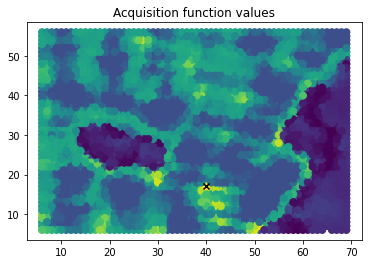

11/100
Epoch 1/200 ... Training loss: 0.9063
Epoch 10/200 ... Training loss: 0.8803
Epoch 20/200 ... Training loss: 0.8264
Epoch 30/200 ... Training loss: 0.7746
Epoch 40/200 ... Training loss: 0.726
Epoch 50/200 ... Training loss: 0.6802
Epoch 60/200 ... Training loss: 0.6322
Epoch 70/200 ... Training loss: 0.5876
Epoch 80/200 ... Training loss: 0.542
Epoch 90/200 ... Training loss: 0.4966
Epoch 100/200 ... Training loss: 0.4511
Epoch 110/200 ... Training loss: 0.4052
Epoch 120/200 ... Training loss: 0.3592
Epoch 130/200 ... Training loss: 0.3131
Epoch 140/200 ... Training loss: 0.2682
Epoch 150/200 ... Training loss: 0.2241
Epoch 160/200 ... Training loss: 0.181
Epoch 170/200 ... Training loss: 0.1389
Epoch 180/200 ... Training loss: 0.0978
Epoch 190/200 ... Training loss: 0.0576
Epoch 200/200 ... Training loss: 0.0185


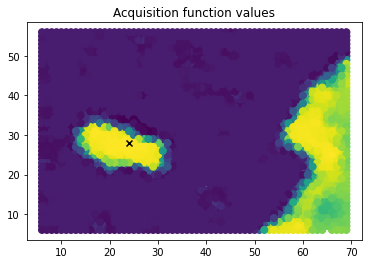

12/100
Epoch 1/200 ... Training loss: 0.9037
Epoch 10/200 ... Training loss: 0.8778
Epoch 20/200 ... Training loss: 0.821
Epoch 30/200 ... Training loss: 0.77
Epoch 40/200 ... Training loss: 0.7212
Epoch 50/200 ... Training loss: 0.6736
Epoch 60/200 ... Training loss: 0.6273
Epoch 70/200 ... Training loss: 0.5826
Epoch 80/200 ... Training loss: 0.537
Epoch 90/200 ... Training loss: 0.4916
Epoch 100/200 ... Training loss: 0.4462
Epoch 110/200 ... Training loss: 0.4007
Epoch 120/200 ... Training loss: 0.3552
Epoch 130/200 ... Training loss: 0.3097
Epoch 140/200 ... Training loss: 0.2649
Epoch 150/200 ... Training loss: 0.2212
Epoch 160/200 ... Training loss: 0.1794
Epoch 170/200 ... Training loss: 0.1336
Epoch 180/200 ... Training loss: 0.0902
Epoch 190/200 ... Training loss: 0.0483
Epoch 200/200 ... Training loss: 0.0075


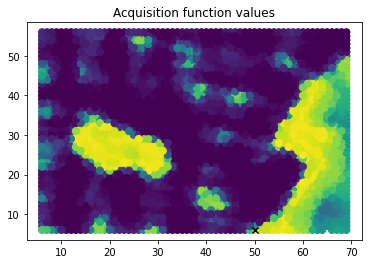

13/100
Epoch 1/200 ... Training loss: 0.8979
Epoch 10/200 ... Training loss: 0.8659
Epoch 20/200 ... Training loss: 0.8111
Epoch 30/200 ... Training loss: 0.7628
Epoch 40/200 ... Training loss: 0.7152
Epoch 50/200 ... Training loss: 0.6692
Epoch 60/200 ... Training loss: 0.6243
Epoch 70/200 ... Training loss: 0.5797
Epoch 80/200 ... Training loss: 0.535
Epoch 90/200 ... Training loss: 0.49
Epoch 100/200 ... Training loss: 0.4446
Epoch 110/200 ... Training loss: 0.3989
Epoch 120/200 ... Training loss: 0.3534
Epoch 130/200 ... Training loss: 0.3091
Epoch 140/200 ... Training loss: 0.2649
Epoch 150/200 ... Training loss: 0.2195
Epoch 160/200 ... Training loss: 0.1752
Epoch 170/200 ... Training loss: 0.1318
Epoch 180/200 ... Training loss: 0.0894
Epoch 190/200 ... Training loss: 0.0478
Epoch 200/200 ... Training loss: 0.007


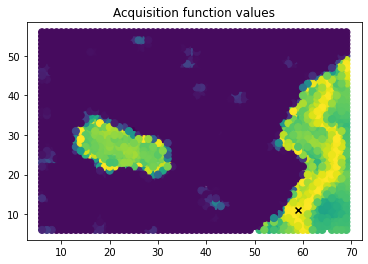

14/100
Epoch 1/200 ... Training loss: 0.8917
Epoch 10/200 ... Training loss: 0.8534
Epoch 20/200 ... Training loss: 0.8099
Epoch 30/200 ... Training loss: 0.7588
Epoch 40/200 ... Training loss: 0.7114
Epoch 50/200 ... Training loss: 0.6657
Epoch 60/200 ... Training loss: 0.6209
Epoch 70/200 ... Training loss: 0.5762
Epoch 80/200 ... Training loss: 0.5311
Epoch 90/200 ... Training loss: 0.4861
Epoch 100/200 ... Training loss: 0.441
Epoch 110/200 ... Training loss: 0.3955
Epoch 120/200 ... Training loss: 0.3499
Epoch 130/200 ... Training loss: 0.3047
Epoch 140/200 ... Training loss: 0.2603
Epoch 150/200 ... Training loss: 0.2165
Epoch 160/200 ... Training loss: 0.1732
Epoch 170/200 ... Training loss: 0.1273
Epoch 180/200 ... Training loss: 0.0841
Epoch 190/200 ... Training loss: 0.0417
Epoch 200/200 ... Training loss: -0.0001


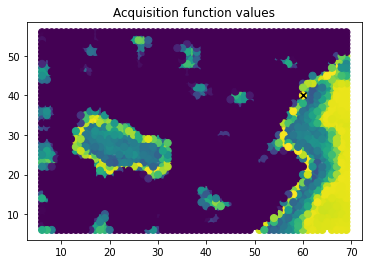

15/100
Epoch 1/200 ... Training loss: 0.8853
Epoch 10/200 ... Training loss: 0.8542
Epoch 20/200 ... Training loss: 0.8017
Epoch 30/200 ... Training loss: 0.7519
Epoch 40/200 ... Training loss: 0.7058
Epoch 50/200 ... Training loss: 0.6606
Epoch 60/200 ... Training loss: 0.6163
Epoch 70/200 ... Training loss: 0.572
Epoch 80/200 ... Training loss: 0.528
Epoch 90/200 ... Training loss: 0.4861
Epoch 100/200 ... Training loss: 0.4394
Epoch 110/200 ... Training loss: 0.3931
Epoch 120/200 ... Training loss: 0.3474
Epoch 130/200 ... Training loss: 0.3013
Epoch 140/200 ... Training loss: 0.2557
Epoch 150/200 ... Training loss: 0.2106
Epoch 160/200 ... Training loss: 0.1663
Epoch 170/200 ... Training loss: 0.1227
Epoch 180/200 ... Training loss: 0.08
Epoch 190/200 ... Training loss: 0.0382
Epoch 200/200 ... Training loss: -0.0029


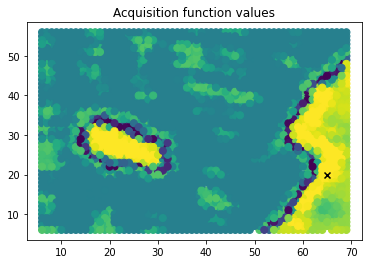

16/100
Epoch 1/200 ... Training loss: 0.8793
Epoch 10/200 ... Training loss: 0.8454
Epoch 20/200 ... Training loss: 0.7967
Epoch 30/200 ... Training loss: 0.748
Epoch 40/200 ... Training loss: 0.7016
Epoch 50/200 ... Training loss: 0.6562
Epoch 60/200 ... Training loss: 0.6121
Epoch 70/200 ... Training loss: 0.5681
Epoch 80/200 ... Training loss: 0.5237
Epoch 90/200 ... Training loss: 0.4815
Epoch 100/200 ... Training loss: 0.4354
Epoch 110/200 ... Training loss: 0.3897
Epoch 120/200 ... Training loss: 0.3437
Epoch 130/200 ... Training loss: 0.2979
Epoch 140/200 ... Training loss: 0.2518
Epoch 150/200 ... Training loss: 0.2065
Epoch 160/200 ... Training loss: 0.1618
Epoch 170/200 ... Training loss: 0.1178
Epoch 180/200 ... Training loss: 0.0747
Epoch 190/200 ... Training loss: 0.0323
Epoch 200/200 ... Training loss: -0.0094


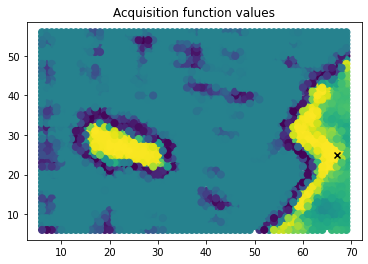

17/100
Epoch 1/200 ... Training loss: 0.8746
Epoch 10/200 ... Training loss: 0.8443
Epoch 20/200 ... Training loss: 0.7914
Epoch 30/200 ... Training loss: 0.7445
Epoch 40/200 ... Training loss: 0.6991
Epoch 50/200 ... Training loss: 0.6542
Epoch 60/200 ... Training loss: 0.6098
Epoch 70/200 ... Training loss: 0.5654
Epoch 80/200 ... Training loss: 0.5255
Epoch 90/200 ... Training loss: 0.4762
Epoch 100/200 ... Training loss: 0.4317
Epoch 110/200 ... Training loss: 0.3862
Epoch 120/200 ... Training loss: 0.3408
Epoch 130/200 ... Training loss: 0.2955
Epoch 140/200 ... Training loss: 0.2503
Epoch 150/200 ... Training loss: 0.2053
Epoch 160/200 ... Training loss: 0.1605
Epoch 170/200 ... Training loss: 0.1165
Epoch 180/200 ... Training loss: 0.0728
Epoch 190/200 ... Training loss: 0.0292
Epoch 200/200 ... Training loss: -0.0141


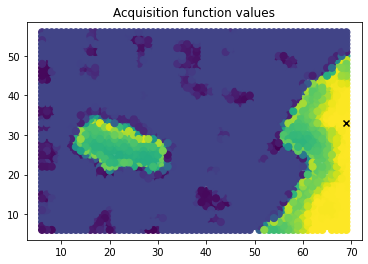

18/100
Epoch 1/200 ... Training loss: 0.8717
Epoch 10/200 ... Training loss: 0.8355
Epoch 20/200 ... Training loss: 0.7958
Epoch 30/200 ... Training loss: 0.7429
Epoch 40/200 ... Training loss: 0.6965
Epoch 50/200 ... Training loss: 0.6524
Epoch 60/200 ... Training loss: 0.6078
Epoch 70/200 ... Training loss: 0.5636
Epoch 80/200 ... Training loss: 0.523
Epoch 90/200 ... Training loss: 0.4733
Epoch 100/200 ... Training loss: 0.4302
Epoch 110/200 ... Training loss: 0.3844
Epoch 120/200 ... Training loss: 0.3385
Epoch 130/200 ... Training loss: 0.2923
Epoch 140/200 ... Training loss: 0.2459
Epoch 150/200 ... Training loss: 0.2006
Epoch 160/200 ... Training loss: 0.1558
Epoch 170/200 ... Training loss: 0.1122
Epoch 180/200 ... Training loss: 0.0665
Epoch 190/200 ... Training loss: 0.0224
Epoch 200/200 ... Training loss: -0.0211


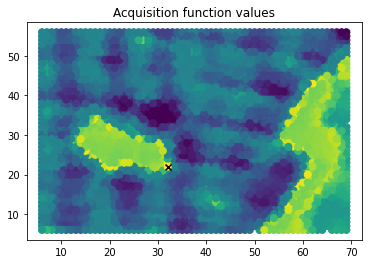

19/100
Epoch 1/200 ... Training loss: 0.8682
Epoch 10/200 ... Training loss: 0.8355
Epoch 20/200 ... Training loss: 0.7898
Epoch 30/200 ... Training loss: 0.7418
Epoch 40/200 ... Training loss: 0.6951
Epoch 50/200 ... Training loss: 0.6502
Epoch 60/200 ... Training loss: 0.6057
Epoch 70/200 ... Training loss: 0.5612
Epoch 80/200 ... Training loss: 0.5159
Epoch 90/200 ... Training loss: 0.4739
Epoch 100/200 ... Training loss: 0.4296
Epoch 110/200 ... Training loss: 0.383
Epoch 120/200 ... Training loss: 0.3366
Epoch 130/200 ... Training loss: 0.2904
Epoch 140/200 ... Training loss: 0.2444
Epoch 150/200 ... Training loss: 0.1982
Epoch 160/200 ... Training loss: 0.1537
Epoch 170/200 ... Training loss: 0.1069
Epoch 180/200 ... Training loss: 0.0614
Epoch 190/200 ... Training loss: 0.0169
Epoch 200/200 ... Training loss: -0.0269


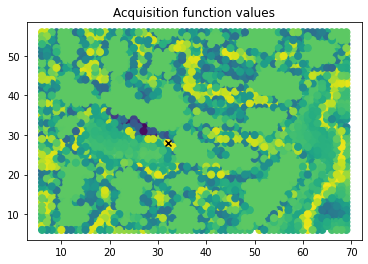

20/100
Epoch 1/200 ... Training loss: 0.8638
Epoch 10/200 ... Training loss: 0.8546
Epoch 20/200 ... Training loss: 0.7859
Epoch 30/200 ... Training loss: 0.7398
Epoch 40/200 ... Training loss: 0.6967
Epoch 50/200 ... Training loss: 0.6516
Epoch 60/200 ... Training loss: 0.6069
Epoch 70/200 ... Training loss: 0.5623
Epoch 80/200 ... Training loss: 0.5174
Epoch 90/200 ... Training loss: 0.4718
Epoch 100/200 ... Training loss: 0.4251
Epoch 110/200 ... Training loss: 0.3782
Epoch 120/200 ... Training loss: 0.3314
Epoch 130/200 ... Training loss: 0.2848
Epoch 140/200 ... Training loss: 0.2387
Epoch 150/200 ... Training loss: 0.1925
Epoch 160/200 ... Training loss: 0.1465
Epoch 170/200 ... Training loss: 0.1009
Epoch 180/200 ... Training loss: 0.0559
Epoch 190/200 ... Training loss: 0.0107
Epoch 200/200 ... Training loss: -0.0342


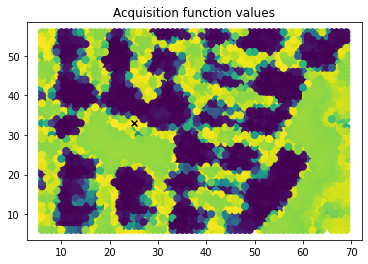

21/100
Epoch 1/200 ... Training loss: 0.8612
Epoch 10/200 ... Training loss: 0.8251
Epoch 20/200 ... Training loss: 0.7825
Epoch 30/200 ... Training loss: 0.7383
Epoch 40/200 ... Training loss: 0.6912
Epoch 50/200 ... Training loss: 0.6466
Epoch 60/200 ... Training loss: 0.6026
Epoch 70/200 ... Training loss: 0.5586
Epoch 80/200 ... Training loss: 0.5143
Epoch 90/200 ... Training loss: 0.4696
Epoch 100/200 ... Training loss: 0.4242
Epoch 110/200 ... Training loss: 0.3784
Epoch 120/200 ... Training loss: 0.3327
Epoch 130/200 ... Training loss: 0.2869
Epoch 140/200 ... Training loss: 0.2414
Epoch 150/200 ... Training loss: 0.1958
Epoch 160/200 ... Training loss: 0.1498
Epoch 170/200 ... Training loss: 0.1039
Epoch 180/200 ... Training loss: 0.0584
Epoch 190/200 ... Training loss: 0.0117
Epoch 200/200 ... Training loss: -0.0336


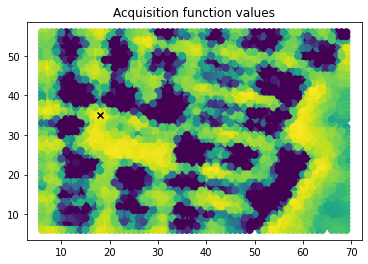

22/100
Epoch 1/200 ... Training loss: 0.8602
Epoch 10/200 ... Training loss: 0.8259
Epoch 20/200 ... Training loss: 0.7785
Epoch 30/200 ... Training loss: 0.7326
Epoch 40/200 ... Training loss: 0.6883
Epoch 50/200 ... Training loss: 0.6443
Epoch 60/200 ... Training loss: 0.6004
Epoch 70/200 ... Training loss: 0.5563
Epoch 80/200 ... Training loss: 0.5115
Epoch 90/200 ... Training loss: 0.4663
Epoch 100/200 ... Training loss: 0.4211
Epoch 110/200 ... Training loss: 0.3753
Epoch 120/200 ... Training loss: 0.3287
Epoch 130/200 ... Training loss: 0.2824
Epoch 140/200 ... Training loss: 0.2367
Epoch 150/200 ... Training loss: 0.1912
Epoch 160/200 ... Training loss: 0.1456
Epoch 170/200 ... Training loss: 0.1005
Epoch 180/200 ... Training loss: 0.0558
Epoch 190/200 ... Training loss: 0.0114
Epoch 200/200 ... Training loss: -0.0324


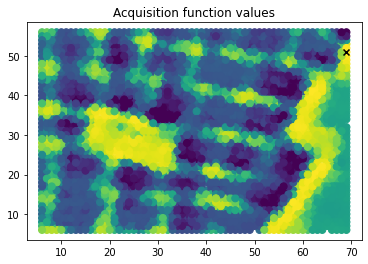

23/100
Epoch 1/200 ... Training loss: 0.8564
Epoch 10/200 ... Training loss: 0.8289
Epoch 20/200 ... Training loss: 0.7783
Epoch 30/200 ... Training loss: 0.732
Epoch 40/200 ... Training loss: 0.6865
Epoch 50/200 ... Training loss: 0.6422
Epoch 60/200 ... Training loss: 0.5984
Epoch 70/200 ... Training loss: 0.5544
Epoch 80/200 ... Training loss: 0.5099
Epoch 90/200 ... Training loss: 0.4636
Epoch 100/200 ... Training loss: 0.42
Epoch 110/200 ... Training loss: 0.3736
Epoch 120/200 ... Training loss: 0.3265
Epoch 130/200 ... Training loss: 0.2799
Epoch 140/200 ... Training loss: 0.2336
Epoch 150/200 ... Training loss: 0.1875
Epoch 160/200 ... Training loss: 0.1418
Epoch 170/200 ... Training loss: 0.0964
Epoch 180/200 ... Training loss: 0.0514
Epoch 190/200 ... Training loss: 0.0068
Epoch 200/200 ... Training loss: -0.0374


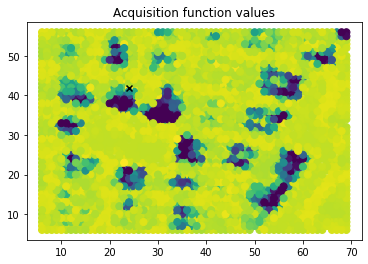

24/100
Epoch 1/200 ... Training loss: 0.8555
Epoch 10/200 ... Training loss: 0.8182
Epoch 20/200 ... Training loss: 0.775
Epoch 30/200 ... Training loss: 0.7292
Epoch 40/200 ... Training loss: 0.6849
Epoch 50/200 ... Training loss: 0.642
Epoch 60/200 ... Training loss: 0.5974
Epoch 70/200 ... Training loss: 0.553
Epoch 80/200 ... Training loss: 0.5085
Epoch 90/200 ... Training loss: 0.4628
Epoch 100/200 ... Training loss: 0.4169
Epoch 110/200 ... Training loss: 0.371
Epoch 120/200 ... Training loss: 0.325
Epoch 130/200 ... Training loss: 0.2794
Epoch 140/200 ... Training loss: 0.2339
Epoch 150/200 ... Training loss: 0.1881
Epoch 160/200 ... Training loss: 0.1426
Epoch 170/200 ... Training loss: 0.0975
Epoch 180/200 ... Training loss: 0.0524
Epoch 190/200 ... Training loss: 0.0076
Epoch 200/200 ... Training loss: -0.037


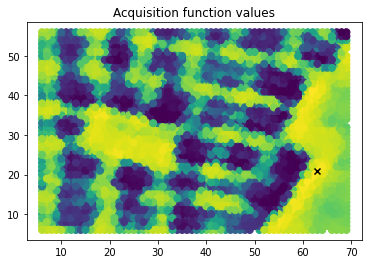

25/100
Epoch 1/200 ... Training loss: 0.8522
Epoch 10/200 ... Training loss: 0.8197
Epoch 20/200 ... Training loss: 0.772
Epoch 30/200 ... Training loss: 0.7259
Epoch 40/200 ... Training loss: 0.6817
Epoch 50/200 ... Training loss: 0.6379
Epoch 60/200 ... Training loss: 0.594
Epoch 70/200 ... Training loss: 0.5495
Epoch 80/200 ... Training loss: 0.5062
Epoch 90/200 ... Training loss: 0.4608
Epoch 100/200 ... Training loss: 0.4152
Epoch 110/200 ... Training loss: 0.3688
Epoch 120/200 ... Training loss: 0.325
Epoch 130/200 ... Training loss: 0.2782
Epoch 140/200 ... Training loss: 0.2317
Epoch 150/200 ... Training loss: 0.1857
Epoch 160/200 ... Training loss: 0.1401
Epoch 170/200 ... Training loss: 0.0947
Epoch 180/200 ... Training loss: 0.0497
Epoch 190/200 ... Training loss: 0.0047
Epoch 200/200 ... Training loss: -0.0401


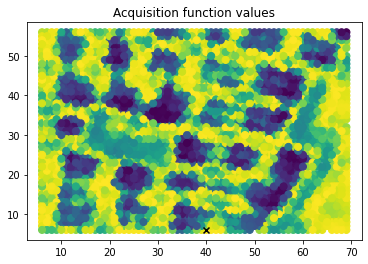

26/100
Epoch 1/200 ... Training loss: 0.8506
Epoch 10/200 ... Training loss: 0.8176
Epoch 20/200 ... Training loss: 0.7722
Epoch 30/200 ... Training loss: 0.7279
Epoch 40/200 ... Training loss: 0.6841
Epoch 50/200 ... Training loss: 0.6405
Epoch 60/200 ... Training loss: 0.5965
Epoch 70/200 ... Training loss: 0.5519
Epoch 80/200 ... Training loss: 0.5055
Epoch 90/200 ... Training loss: 0.4598
Epoch 100/200 ... Training loss: 0.4144
Epoch 110/200 ... Training loss: 0.3689
Epoch 120/200 ... Training loss: 0.323
Epoch 130/200 ... Training loss: 0.2769
Epoch 140/200 ... Training loss: 0.2308
Epoch 150/200 ... Training loss: 0.1848
Epoch 160/200 ... Training loss: 0.1389
Epoch 170/200 ... Training loss: 0.0933
Epoch 180/200 ... Training loss: 0.0479
Epoch 190/200 ... Training loss: 0.0026
Epoch 200/200 ... Training loss: -0.0424


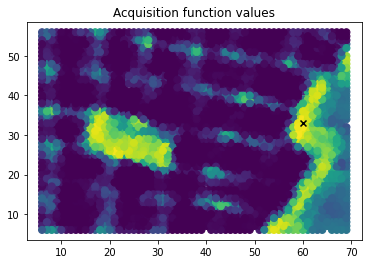

27/100
Epoch 1/200 ... Training loss: 0.8477
Epoch 10/200 ... Training loss: 0.8151
Epoch 20/200 ... Training loss: 0.7684
Epoch 30/200 ... Training loss: 0.7237
Epoch 40/200 ... Training loss: 0.6809
Epoch 50/200 ... Training loss: 0.638
Epoch 60/200 ... Training loss: 0.5945
Epoch 70/200 ... Training loss: 0.5502
Epoch 80/200 ... Training loss: 0.5047
Epoch 90/200 ... Training loss: 0.4584
Epoch 100/200 ... Training loss: 0.4125
Epoch 110/200 ... Training loss: 0.3672
Epoch 120/200 ... Training loss: 0.3219
Epoch 130/200 ... Training loss: 0.2763
Epoch 140/200 ... Training loss: 0.2302
Epoch 150/200 ... Training loss: 0.1842
Epoch 160/200 ... Training loss: 0.1377
Epoch 170/200 ... Training loss: 0.0915
Epoch 180/200 ... Training loss: 0.0457
Epoch 190/200 ... Training loss: 0.0001
Epoch 200/200 ... Training loss: -0.0454


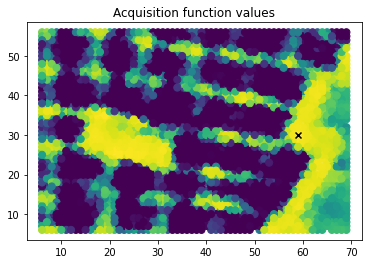

28/100
Epoch 1/200 ... Training loss: 0.8452
Epoch 10/200 ... Training loss: 0.8082
Epoch 20/200 ... Training loss: 0.7636
Epoch 30/200 ... Training loss: 0.7213
Epoch 40/200 ... Training loss: 0.6787
Epoch 50/200 ... Training loss: 0.6355
Epoch 60/200 ... Training loss: 0.5925
Epoch 70/200 ... Training loss: 0.5475
Epoch 80/200 ... Training loss: 0.5018
Epoch 90/200 ... Training loss: 0.4558
Epoch 100/200 ... Training loss: 0.4101
Epoch 110/200 ... Training loss: 0.3647
Epoch 120/200 ... Training loss: 0.3194
Epoch 130/200 ... Training loss: 0.2738
Epoch 140/200 ... Training loss: 0.2307
Epoch 150/200 ... Training loss: 0.1827
Epoch 160/200 ... Training loss: 0.136
Epoch 170/200 ... Training loss: 0.0897
Epoch 180/200 ... Training loss: 0.0442
Epoch 190/200 ... Training loss: -0.0012
Epoch 200/200 ... Training loss: -0.0465


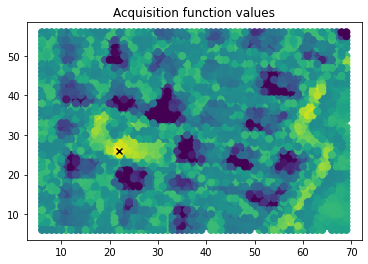

29/100
Epoch 1/200 ... Training loss: 0.8451
Epoch 10/200 ... Training loss: 0.8117
Epoch 20/200 ... Training loss: 0.7659
Epoch 30/200 ... Training loss: 0.7474
Epoch 40/200 ... Training loss: 0.679
Epoch 50/200 ... Training loss: 0.6361
Epoch 60/200 ... Training loss: 0.5926
Epoch 70/200 ... Training loss: 0.5535
Epoch 80/200 ... Training loss: 0.5079
Epoch 90/200 ... Training loss: 0.4634
Epoch 100/200 ... Training loss: 0.4181
Epoch 110/200 ... Training loss: 0.3717
Epoch 120/200 ... Training loss: 0.3246
Epoch 130/200 ... Training loss: 0.2778
Epoch 140/200 ... Training loss: 0.2309
Epoch 150/200 ... Training loss: 0.1837
Epoch 160/200 ... Training loss: 0.1422
Epoch 170/200 ... Training loss: 0.0955
Epoch 180/200 ... Training loss: 0.0474
Epoch 190/200 ... Training loss: 0.0007
Epoch 200/200 ... Training loss: -0.0455


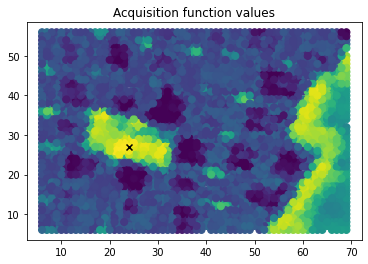

30/100
Epoch 1/200 ... Training loss: 0.8457
Epoch 10/200 ... Training loss: 0.8162
Epoch 20/200 ... Training loss: 0.7605
Epoch 30/200 ... Training loss: 0.7181
Epoch 40/200 ... Training loss: 0.6758
Epoch 50/200 ... Training loss: 0.633
Epoch 60/200 ... Training loss: 0.5906
Epoch 70/200 ... Training loss: 0.5463
Epoch 80/200 ... Training loss: 0.5004
Epoch 90/200 ... Training loss: 0.4539
Epoch 100/200 ... Training loss: 0.4075
Epoch 110/200 ... Training loss: 0.3617
Epoch 120/200 ... Training loss: 0.3161
Epoch 130/200 ... Training loss: 0.2706
Epoch 140/200 ... Training loss: 0.2254
Epoch 150/200 ... Training loss: 0.1827
Epoch 160/200 ... Training loss: 0.1333
Epoch 170/200 ... Training loss: 0.0864
Epoch 180/200 ... Training loss: 0.0401
Epoch 190/200 ... Training loss: -0.0058
Epoch 200/200 ... Training loss: -0.0517


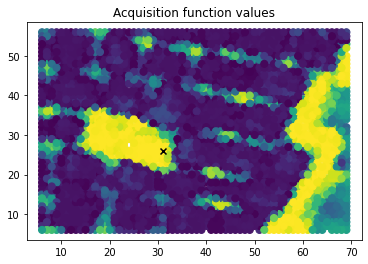

31/100
Epoch 1/200 ... Training loss: 0.8441
Epoch 10/200 ... Training loss: 0.8027
Epoch 20/200 ... Training loss: 0.7591
Epoch 30/200 ... Training loss: 0.7174
Epoch 40/200 ... Training loss: 0.675
Epoch 50/200 ... Training loss: 0.6318
Epoch 60/200 ... Training loss: 0.5886
Epoch 70/200 ... Training loss: 0.5443
Epoch 80/200 ... Training loss: 0.501
Epoch 90/200 ... Training loss: 0.4558
Epoch 100/200 ... Training loss: 0.41
Epoch 110/200 ... Training loss: 0.3641
Epoch 120/200 ... Training loss: 0.3184
Epoch 130/200 ... Training loss: 0.2727
Epoch 140/200 ... Training loss: 0.227
Epoch 150/200 ... Training loss: 0.1812
Epoch 160/200 ... Training loss: 0.1354
Epoch 170/200 ... Training loss: 0.0889
Epoch 180/200 ... Training loss: 0.0415
Epoch 190/200 ... Training loss: -0.0055
Epoch 200/200 ... Training loss: -0.0522


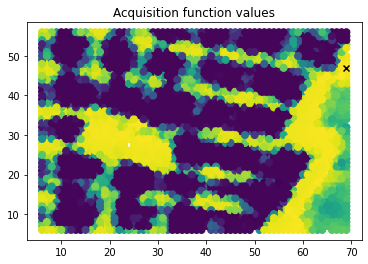

32/100
Epoch 1/200 ... Training loss: 0.8417
Epoch 10/200 ... Training loss: 0.8035
Epoch 20/200 ... Training loss: 0.7592
Epoch 30/200 ... Training loss: 0.7161
Epoch 40/200 ... Training loss: 0.6727
Epoch 50/200 ... Training loss: 0.6302
Epoch 60/200 ... Training loss: 0.5873
Epoch 70/200 ... Training loss: 0.5433
Epoch 80/200 ... Training loss: 0.4973
Epoch 90/200 ... Training loss: 0.4508
Epoch 100/200 ... Training loss: 0.4051
Epoch 110/200 ... Training loss: 0.3592
Epoch 120/200 ... Training loss: 0.3132
Epoch 130/200 ... Training loss: 0.2668
Epoch 140/200 ... Training loss: 0.2207
Epoch 150/200 ... Training loss: 0.1742
Epoch 160/200 ... Training loss: 0.1274
Epoch 170/200 ... Training loss: 0.0808
Epoch 180/200 ... Training loss: 0.0342
Epoch 190/200 ... Training loss: -0.0122
Epoch 200/200 ... Training loss: -0.0587


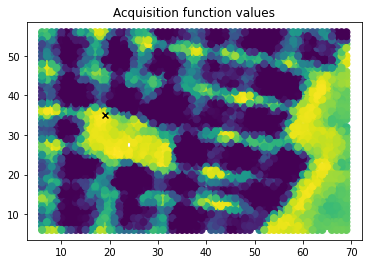

33/100
Epoch 1/200 ... Training loss: 0.8417
Epoch 10/200 ... Training loss: 0.7998
Epoch 20/200 ... Training loss: 0.7559
Epoch 30/200 ... Training loss: 0.7143
Epoch 40/200 ... Training loss: 0.6724
Epoch 50/200 ... Training loss: 0.6296
Epoch 60/200 ... Training loss: 0.583
Epoch 70/200 ... Training loss: 0.541
Epoch 80/200 ... Training loss: 0.4932
Epoch 90/200 ... Training loss: 0.4486
Epoch 100/200 ... Training loss: 0.4032
Epoch 110/200 ... Training loss: 0.3578
Epoch 120/200 ... Training loss: 0.3125
Epoch 130/200 ... Training loss: 0.2671
Epoch 140/200 ... Training loss: 0.2217
Epoch 150/200 ... Training loss: 0.1758
Epoch 160/200 ... Training loss: 0.1294
Epoch 170/200 ... Training loss: 0.0829
Epoch 180/200 ... Training loss: 0.0365
Epoch 190/200 ... Training loss: -0.01
Epoch 200/200 ... Training loss: -0.0565


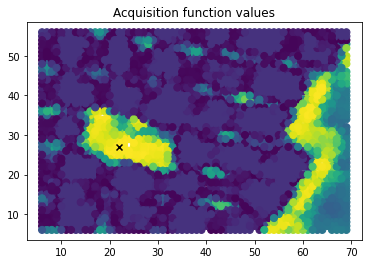

34/100
Epoch 1/200 ... Training loss: 0.8408
Epoch 10/200 ... Training loss: 0.7996
Epoch 20/200 ... Training loss: 0.7556
Epoch 30/200 ... Training loss: 0.7123
Epoch 40/200 ... Training loss: 0.6704
Epoch 50/200 ... Training loss: 0.628
Epoch 60/200 ... Training loss: 0.585
Epoch 70/200 ... Training loss: 0.5407
Epoch 80/200 ... Training loss: 0.4949
Epoch 90/200 ... Training loss: 0.4492
Epoch 100/200 ... Training loss: 0.4038
Epoch 110/200 ... Training loss: 0.3581
Epoch 120/200 ... Training loss: 0.3121
Epoch 130/200 ... Training loss: 0.2661
Epoch 140/200 ... Training loss: 0.2198
Epoch 150/200 ... Training loss: 0.1732
Epoch 160/200 ... Training loss: 0.1267
Epoch 170/200 ... Training loss: 0.0803
Epoch 180/200 ... Training loss: 0.0339
Epoch 190/200 ... Training loss: -0.0125
Epoch 200/200 ... Training loss: -0.0591


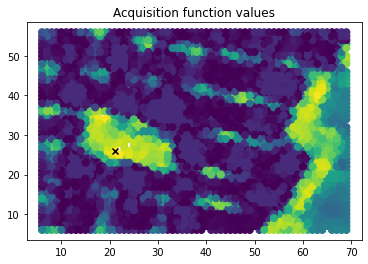

35/100
Epoch 1/200 ... Training loss: 0.8389
Epoch 10/200 ... Training loss: 0.8032
Epoch 20/200 ... Training loss: 0.7547
Epoch 30/200 ... Training loss: 0.7117
Epoch 40/200 ... Training loss: 0.6696
Epoch 50/200 ... Training loss: 0.6274
Epoch 60/200 ... Training loss: 0.5846
Epoch 70/200 ... Training loss: 0.5421
Epoch 80/200 ... Training loss: 0.4974
Epoch 90/200 ... Training loss: 0.4519
Epoch 100/200 ... Training loss: 0.405
Epoch 110/200 ... Training loss: 0.3588
Epoch 120/200 ... Training loss: 0.3129
Epoch 130/200 ... Training loss: 0.2669
Epoch 140/200 ... Training loss: 0.2201
Epoch 150/200 ... Training loss: 0.1729
Epoch 160/200 ... Training loss: 0.1265
Epoch 170/200 ... Training loss: 0.0797
Epoch 180/200 ... Training loss: 0.0329
Epoch 190/200 ... Training loss: -0.0139
Epoch 200/200 ... Training loss: -0.0609


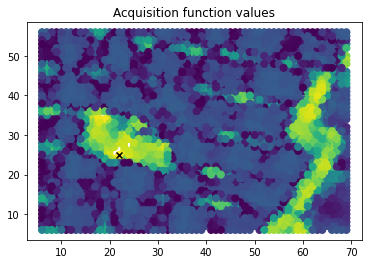

36/100
Epoch 1/200 ... Training loss: 0.8381
Epoch 10/200 ... Training loss: 0.8061
Epoch 20/200 ... Training loss: 0.7528
Epoch 30/200 ... Training loss: 0.7112
Epoch 40/200 ... Training loss: 0.669
Epoch 50/200 ... Training loss: 0.6271
Epoch 60/200 ... Training loss: 0.585
Epoch 70/200 ... Training loss: 0.5422
Epoch 80/200 ... Training loss: 0.498
Epoch 90/200 ... Training loss: 0.4517
Epoch 100/200 ... Training loss: 0.4036
Epoch 110/200 ... Training loss: 0.3578
Epoch 120/200 ... Training loss: 0.3116
Epoch 130/200 ... Training loss: 0.2649
Epoch 140/200 ... Training loss: 0.2181
Epoch 150/200 ... Training loss: 0.1711
Epoch 160/200 ... Training loss: 0.1242
Epoch 170/200 ... Training loss: 0.0773
Epoch 180/200 ... Training loss: 0.0303
Epoch 190/200 ... Training loss: -0.0167
Epoch 200/200 ... Training loss: -0.0638


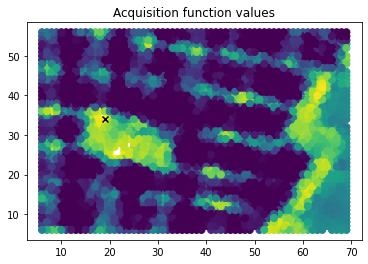

37/100
Epoch 1/200 ... Training loss: 0.837
Epoch 10/200 ... Training loss: 0.7977
Epoch 20/200 ... Training loss: 0.7504
Epoch 30/200 ... Training loss: 0.709
Epoch 40/200 ... Training loss: 0.6672
Epoch 50/200 ... Training loss: 0.6246
Epoch 60/200 ... Training loss: 0.5817
Epoch 70/200 ... Training loss: 0.538
Epoch 80/200 ... Training loss: 0.4935
Epoch 90/200 ... Training loss: 0.4478
Epoch 100/200 ... Training loss: 0.4018
Epoch 110/200 ... Training loss: 0.3561
Epoch 120/200 ... Training loss: 0.3099
Epoch 130/200 ... Training loss: 0.2637
Epoch 140/200 ... Training loss: 0.2173
Epoch 150/200 ... Training loss: 0.1707
Epoch 160/200 ... Training loss: 0.1239
Epoch 170/200 ... Training loss: 0.0771
Epoch 180/200 ... Training loss: 0.0304
Epoch 190/200 ... Training loss: -0.0165
Epoch 200/200 ... Training loss: -0.0635


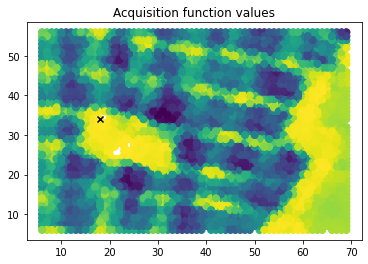

38/100
Epoch 1/200 ... Training loss: 0.8359
Epoch 10/200 ... Training loss: 0.787
Epoch 20/200 ... Training loss: 0.7486
Epoch 30/200 ... Training loss: 0.7073
Epoch 40/200 ... Training loss: 0.6658
Epoch 50/200 ... Training loss: 0.6229
Epoch 60/200 ... Training loss: 0.5792
Epoch 70/200 ... Training loss: 0.5382
Epoch 80/200 ... Training loss: 0.4944
Epoch 90/200 ... Training loss: 0.4492
Epoch 100/200 ... Training loss: 0.4037
Epoch 110/200 ... Training loss: 0.358
Epoch 120/200 ... Training loss: 0.3124
Epoch 130/200 ... Training loss: 0.2668
Epoch 140/200 ... Training loss: 0.2204
Epoch 150/200 ... Training loss: 0.1733
Epoch 160/200 ... Training loss: 0.1262
Epoch 170/200 ... Training loss: 0.0792
Epoch 180/200 ... Training loss: 0.0319
Epoch 190/200 ... Training loss: -0.0155
Epoch 200/200 ... Training loss: -0.0629


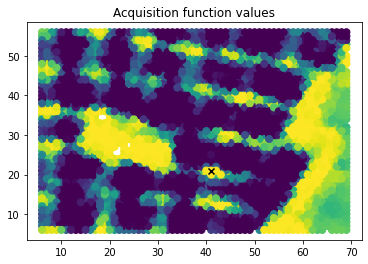

39/100
Epoch 1/200 ... Training loss: 0.8342
Epoch 10/200 ... Training loss: 0.7949
Epoch 20/200 ... Training loss: 0.7483
Epoch 30/200 ... Training loss: 0.7057
Epoch 40/200 ... Training loss: 0.6634
Epoch 50/200 ... Training loss: 0.6217
Epoch 60/200 ... Training loss: 0.5775
Epoch 70/200 ... Training loss: 0.5351
Epoch 80/200 ... Training loss: 0.4903
Epoch 90/200 ... Training loss: 0.4448
Epoch 100/200 ... Training loss: 0.3994
Epoch 110/200 ... Training loss: 0.3534
Epoch 120/200 ... Training loss: 0.3073
Epoch 130/200 ... Training loss: 0.2609
Epoch 140/200 ... Training loss: 0.2149
Epoch 150/200 ... Training loss: 0.1682
Epoch 160/200 ... Training loss: 0.1214
Epoch 170/200 ... Training loss: 0.0746
Epoch 180/200 ... Training loss: 0.0277
Epoch 190/200 ... Training loss: -0.0195
Epoch 200/200 ... Training loss: -0.0669


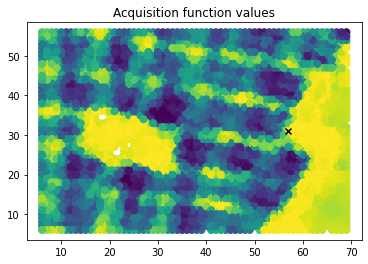

40/100
Epoch 1/200 ... Training loss: 0.8323
Epoch 10/200 ... Training loss: 0.7978
Epoch 20/200 ... Training loss: 0.7524
Epoch 30/200 ... Training loss: 0.7062
Epoch 40/200 ... Training loss: 0.6636
Epoch 50/200 ... Training loss: 0.6206
Epoch 60/200 ... Training loss: 0.5771
Epoch 70/200 ... Training loss: 0.5331
Epoch 80/200 ... Training loss: 0.4886
Epoch 90/200 ... Training loss: 0.4438
Epoch 100/200 ... Training loss: 0.3984
Epoch 110/200 ... Training loss: 0.3523
Epoch 120/200 ... Training loss: 0.3064
Epoch 130/200 ... Training loss: 0.2601
Epoch 140/200 ... Training loss: 0.2137
Epoch 150/200 ... Training loss: 0.1671
Epoch 160/200 ... Training loss: 0.1203
Epoch 170/200 ... Training loss: 0.0732
Epoch 180/200 ... Training loss: 0.026
Epoch 190/200 ... Training loss: -0.0213
Epoch 200/200 ... Training loss: -0.0689


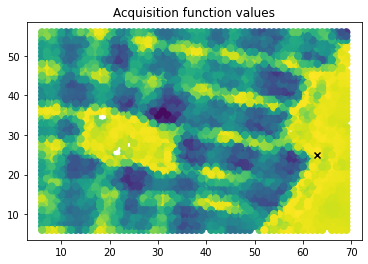

41/100
Epoch 1/200 ... Training loss: 0.8306
Epoch 10/200 ... Training loss: 0.7931
Epoch 20/200 ... Training loss: 0.7468
Epoch 30/200 ... Training loss: 0.705
Epoch 40/200 ... Training loss: 0.6621
Epoch 50/200 ... Training loss: 0.6196
Epoch 60/200 ... Training loss: 0.5759
Epoch 70/200 ... Training loss: 0.5317
Epoch 80/200 ... Training loss: 0.4871
Epoch 90/200 ... Training loss: 0.4424
Epoch 100/200 ... Training loss: 0.3976
Epoch 110/200 ... Training loss: 0.3524
Epoch 120/200 ... Training loss: 0.3065
Epoch 130/200 ... Training loss: 0.2599
Epoch 140/200 ... Training loss: 0.2126
Epoch 150/200 ... Training loss: 0.1658
Epoch 160/200 ... Training loss: 0.1189
Epoch 170/200 ... Training loss: 0.0717
Epoch 180/200 ... Training loss: 0.0243
Epoch 190/200 ... Training loss: -0.0233
Epoch 200/200 ... Training loss: -0.0712


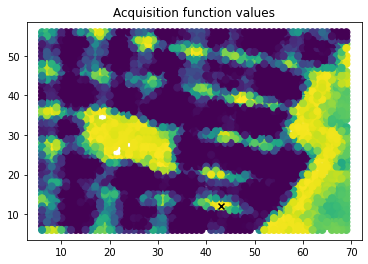

42/100
Epoch 1/200 ... Training loss: 0.8293
Epoch 10/200 ... Training loss: 0.7986
Epoch 20/200 ... Training loss: 0.7463
Epoch 30/200 ... Training loss: 0.704
Epoch 40/200 ... Training loss: 0.6617
Epoch 50/200 ... Training loss: 0.6193
Epoch 60/200 ... Training loss: 0.5763
Epoch 70/200 ... Training loss: 0.5323
Epoch 80/200 ... Training loss: 0.4897
Epoch 90/200 ... Training loss: 0.445
Epoch 100/200 ... Training loss: 0.3995
Epoch 110/200 ... Training loss: 0.3536
Epoch 120/200 ... Training loss: 0.3077
Epoch 130/200 ... Training loss: 0.2613
Epoch 140/200 ... Training loss: 0.2135
Epoch 150/200 ... Training loss: 0.1655
Epoch 160/200 ... Training loss: 0.1183
Epoch 170/200 ... Training loss: 0.0711
Epoch 180/200 ... Training loss: 0.0237
Epoch 190/200 ... Training loss: -0.0239
Epoch 200/200 ... Training loss: -0.0718


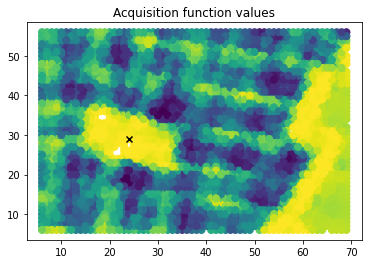

43/100
Epoch 1/200 ... Training loss: 0.8278
Epoch 10/200 ... Training loss: 0.7836
Epoch 20/200 ... Training loss: 0.7476
Epoch 30/200 ... Training loss: 0.7045
Epoch 40/200 ... Training loss: 0.6613
Epoch 50/200 ... Training loss: 0.6185
Epoch 60/200 ... Training loss: 0.5774
Epoch 70/200 ... Training loss: 0.534
Epoch 80/200 ... Training loss: 0.4898
Epoch 90/200 ... Training loss: 0.4449
Epoch 100/200 ... Training loss: 0.3994
Epoch 110/200 ... Training loss: 0.3526
Epoch 120/200 ... Training loss: 0.3057
Epoch 130/200 ... Training loss: 0.2586
Epoch 140/200 ... Training loss: 0.2115
Epoch 150/200 ... Training loss: 0.1641
Epoch 160/200 ... Training loss: 0.1168
Epoch 170/200 ... Training loss: 0.0694
Epoch 180/200 ... Training loss: 0.0218
Epoch 190/200 ... Training loss: -0.026
Epoch 200/200 ... Training loss: -0.0737


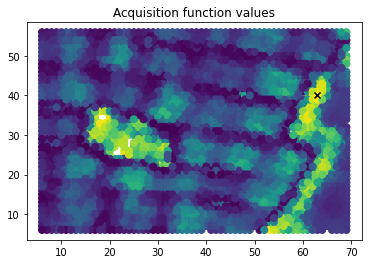

44/100
Epoch 1/200 ... Training loss: 0.8262
Epoch 10/200 ... Training loss: 0.8106
Epoch 20/200 ... Training loss: 0.7438
Epoch 30/200 ... Training loss: 0.7018
Epoch 40/200 ... Training loss: 0.66
Epoch 50/200 ... Training loss: 0.6179
Epoch 60/200 ... Training loss: 0.5751
Epoch 70/200 ... Training loss: 0.5312
Epoch 80/200 ... Training loss: 0.4859
Epoch 90/200 ... Training loss: 0.4406
Epoch 100/200 ... Training loss: 0.3942
Epoch 110/200 ... Training loss: 0.3479
Epoch 120/200 ... Training loss: 0.3014
Epoch 130/200 ... Training loss: 0.2552
Epoch 140/200 ... Training loss: 0.2084
Epoch 150/200 ... Training loss: 0.1616
Epoch 160/200 ... Training loss: 0.1145
Epoch 170/200 ... Training loss: 0.067
Epoch 180/200 ... Training loss: 0.0215
Epoch 190/200 ... Training loss: -0.0278
Epoch 200/200 ... Training loss: -0.0767


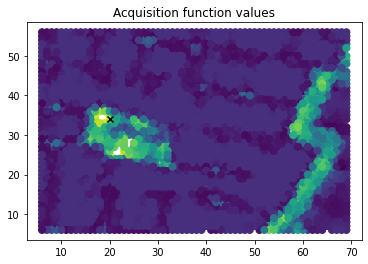

45/100
Epoch 1/200 ... Training loss: 0.8249
Epoch 10/200 ... Training loss: 0.7827
Epoch 20/200 ... Training loss: 0.7457
Epoch 30/200 ... Training loss: 0.7012
Epoch 40/200 ... Training loss: 0.6592
Epoch 50/200 ... Training loss: 0.6164
Epoch 60/200 ... Training loss: 0.5735
Epoch 70/200 ... Training loss: 0.5293
Epoch 80/200 ... Training loss: 0.4851
Epoch 90/200 ... Training loss: 0.4426
Epoch 100/200 ... Training loss: 0.3942
Epoch 110/200 ... Training loss: 0.3484
Epoch 120/200 ... Training loss: 0.303
Epoch 130/200 ... Training loss: 0.2568
Epoch 140/200 ... Training loss: 0.2101
Epoch 150/200 ... Training loss: 0.163
Epoch 160/200 ... Training loss: 0.1155
Epoch 170/200 ... Training loss: 0.0681
Epoch 180/200 ... Training loss: 0.0198
Epoch 190/200 ... Training loss: -0.0287
Epoch 200/200 ... Training loss: -0.0771


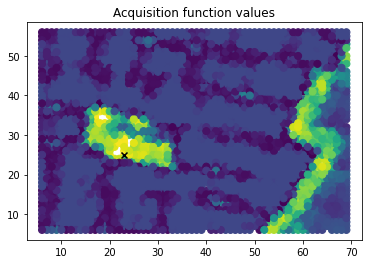

46/100
Epoch 1/200 ... Training loss: 0.824
Epoch 10/200 ... Training loss: 0.781
Epoch 20/200 ... Training loss: 0.742
Epoch 30/200 ... Training loss: 0.7
Epoch 40/200 ... Training loss: 0.6593
Epoch 50/200 ... Training loss: 0.6174
Epoch 60/200 ... Training loss: 0.5743
Epoch 70/200 ... Training loss: 0.531
Epoch 80/200 ... Training loss: 0.4869
Epoch 90/200 ... Training loss: 0.4421
Epoch 100/200 ... Training loss: 0.3969
Epoch 110/200 ... Training loss: 0.3514
Epoch 120/200 ... Training loss: 0.3052
Epoch 130/200 ... Training loss: 0.2589
Epoch 140/200 ... Training loss: 0.2122
Epoch 150/200 ... Training loss: 0.1636
Epoch 160/200 ... Training loss: 0.115
Epoch 170/200 ... Training loss: 0.0669
Epoch 180/200 ... Training loss: 0.0189
Epoch 190/200 ... Training loss: -0.0293
Epoch 200/200 ... Training loss: -0.0777


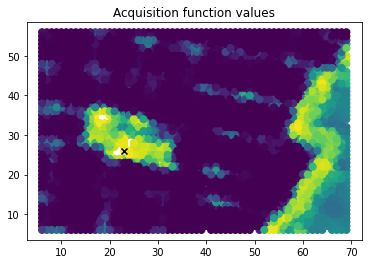

47/100
Epoch 1/200 ... Training loss: 0.8233
Epoch 10/200 ... Training loss: 0.8052
Epoch 20/200 ... Training loss: 0.7394
Epoch 30/200 ... Training loss: 0.6988
Epoch 40/200 ... Training loss: 0.6565
Epoch 50/200 ... Training loss: 0.6143
Epoch 60/200 ... Training loss: 0.5716
Epoch 70/200 ... Training loss: 0.5282
Epoch 80/200 ... Training loss: 0.4839
Epoch 90/200 ... Training loss: 0.4382
Epoch 100/200 ... Training loss: 0.3925
Epoch 110/200 ... Training loss: 0.3465
Epoch 120/200 ... Training loss: 0.3005
Epoch 130/200 ... Training loss: 0.2542
Epoch 140/200 ... Training loss: 0.2079
Epoch 150/200 ... Training loss: 0.1613
Epoch 160/200 ... Training loss: 0.1124
Epoch 170/200 ... Training loss: 0.0643
Epoch 180/200 ... Training loss: 0.0164
Epoch 190/200 ... Training loss: -0.0318
Epoch 200/200 ... Training loss: -0.0802


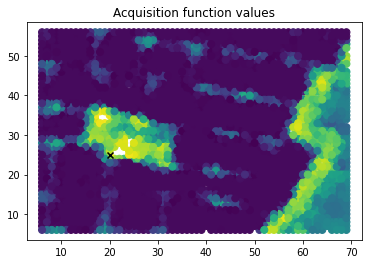

48/100
Epoch 1/200 ... Training loss: 0.8232
Epoch 10/200 ... Training loss: 0.79
Epoch 20/200 ... Training loss: 0.7402
Epoch 30/200 ... Training loss: 0.6983
Epoch 40/200 ... Training loss: 0.6558
Epoch 50/200 ... Training loss: 0.614
Epoch 60/200 ... Training loss: 0.5712
Epoch 70/200 ... Training loss: 0.5274
Epoch 80/200 ... Training loss: 0.483
Epoch 90/200 ... Training loss: 0.4409
Epoch 100/200 ... Training loss: 0.3952
Epoch 110/200 ... Training loss: 0.3493
Epoch 120/200 ... Training loss: 0.3031
Epoch 130/200 ... Training loss: 0.2569
Epoch 140/200 ... Training loss: 0.2102
Epoch 150/200 ... Training loss: 0.1629
Epoch 160/200 ... Training loss: 0.1148
Epoch 170/200 ... Training loss: 0.0658
Epoch 180/200 ... Training loss: 0.0174
Epoch 190/200 ... Training loss: -0.0312
Epoch 200/200 ... Training loss: -0.0799


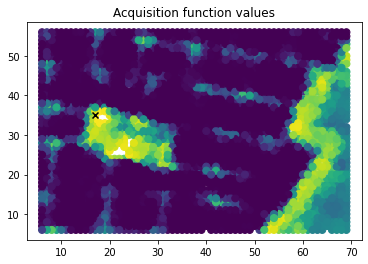

49/100
Epoch 1/200 ... Training loss: 0.8225
Epoch 10/200 ... Training loss: 0.7764
Epoch 20/200 ... Training loss: 0.7398
Epoch 30/200 ... Training loss: 0.6987
Epoch 40/200 ... Training loss: 0.6545
Epoch 50/200 ... Training loss: 0.6204
Epoch 60/200 ... Training loss: 0.5714
Epoch 70/200 ... Training loss: 0.528
Epoch 80/200 ... Training loss: 0.4838
Epoch 90/200 ... Training loss: 0.4387
Epoch 100/200 ... Training loss: 0.3926
Epoch 110/200 ... Training loss: 0.3468
Epoch 120/200 ... Training loss: 0.3006
Epoch 130/200 ... Training loss: 0.2537
Epoch 140/200 ... Training loss: 0.2065
Epoch 150/200 ... Training loss: 0.1589
Epoch 160/200 ... Training loss: 0.1112
Epoch 170/200 ... Training loss: 0.0633
Epoch 180/200 ... Training loss: 0.0153
Epoch 190/200 ... Training loss: -0.033
Epoch 200/200 ... Training loss: -0.0815


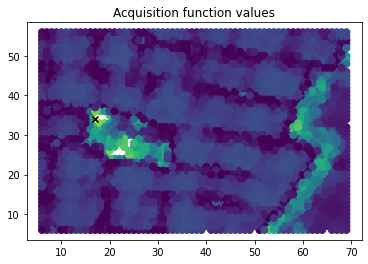

50/100
Epoch 1/200 ... Training loss: 0.8219
Epoch 10/200 ... Training loss: 0.7766
Epoch 20/200 ... Training loss: 0.7396
Epoch 30/200 ... Training loss: 0.6956
Epoch 40/200 ... Training loss: 0.6535
Epoch 50/200 ... Training loss: 0.611
Epoch 60/200 ... Training loss: 0.5691
Epoch 70/200 ... Training loss: 0.5244
Epoch 80/200 ... Training loss: 0.4826
Epoch 90/200 ... Training loss: 0.4416
Epoch 100/200 ... Training loss: 0.3951
Epoch 110/200 ... Training loss: 0.3491
Epoch 120/200 ... Training loss: 0.303
Epoch 130/200 ... Training loss: 0.2561
Epoch 140/200 ... Training loss: 0.2084
Epoch 150/200 ... Training loss: 0.1605
Epoch 160/200 ... Training loss: 0.1124
Epoch 170/200 ... Training loss: 0.0652
Epoch 180/200 ... Training loss: 0.0165
Epoch 190/200 ... Training loss: -0.0321
Epoch 200/200 ... Training loss: -0.0808


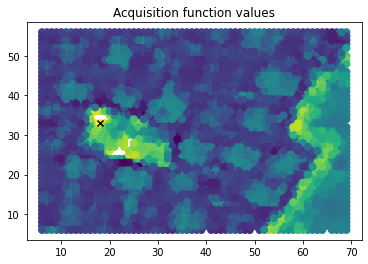

51/100
Epoch 1/200 ... Training loss: 0.821
Epoch 10/200 ... Training loss: 0.7757
Epoch 20/200 ... Training loss: 0.7364
Epoch 30/200 ... Training loss: 0.6943
Epoch 40/200 ... Training loss: 0.6524
Epoch 50/200 ... Training loss: 0.61
Epoch 60/200 ... Training loss: 0.567
Epoch 70/200 ... Training loss: 0.5235
Epoch 80/200 ... Training loss: 0.4854
Epoch 90/200 ... Training loss: 0.4417
Epoch 100/200 ... Training loss: 0.3949
Epoch 110/200 ... Training loss: 0.3485
Epoch 120/200 ... Training loss: 0.3027
Epoch 130/200 ... Training loss: 0.2564
Epoch 140/200 ... Training loss: 0.2093
Epoch 150/200 ... Training loss: 0.1607
Epoch 160/200 ... Training loss: 0.1122
Epoch 170/200 ... Training loss: 0.0639
Epoch 180/200 ... Training loss: 0.0155
Epoch 190/200 ... Training loss: -0.0331
Epoch 200/200 ... Training loss: -0.0821


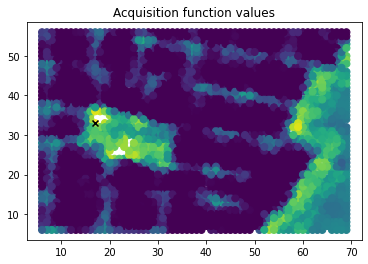

52/100
Epoch 1/200 ... Training loss: 0.82
Epoch 10/200 ... Training loss: 0.7773
Epoch 20/200 ... Training loss: 0.7356
Epoch 30/200 ... Training loss: 0.6949
Epoch 40/200 ... Training loss: 0.6538
Epoch 50/200 ... Training loss: 0.6117
Epoch 60/200 ... Training loss: 0.5685
Epoch 70/200 ... Training loss: 0.5239
Epoch 80/200 ... Training loss: 0.479
Epoch 90/200 ... Training loss: 0.4337
Epoch 100/200 ... Training loss: 0.3876
Epoch 110/200 ... Training loss: 0.3415
Epoch 120/200 ... Training loss: 0.2952
Epoch 130/200 ... Training loss: 0.2486
Epoch 140/200 ... Training loss: 0.2019
Epoch 150/200 ... Training loss: 0.155
Epoch 160/200 ... Training loss: 0.1077
Epoch 170/200 ... Training loss: 0.0598
Epoch 180/200 ... Training loss: 0.0116
Epoch 190/200 ... Training loss: -0.0368
Epoch 200/200 ... Training loss: -0.0856


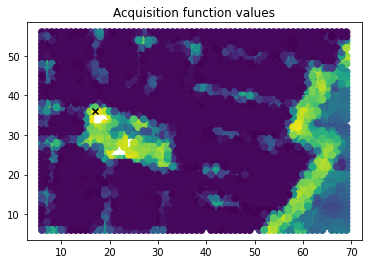

53/100
Epoch 1/200 ... Training loss: 0.8199
Epoch 10/200 ... Training loss: 0.7852
Epoch 20/200 ... Training loss: 0.7358
Epoch 30/200 ... Training loss: 0.6952
Epoch 40/200 ... Training loss: 0.6538
Epoch 50/200 ... Training loss: 0.6111
Epoch 60/200 ... Training loss: 0.5683
Epoch 70/200 ... Training loss: 0.5281
Epoch 80/200 ... Training loss: 0.4841
Epoch 90/200 ... Training loss: 0.4393
Epoch 100/200 ... Training loss: 0.3941
Epoch 110/200 ... Training loss: 0.348
Epoch 120/200 ... Training loss: 0.302
Epoch 130/200 ... Training loss: 0.2553
Epoch 140/200 ... Training loss: 0.2069
Epoch 150/200 ... Training loss: 0.1578
Epoch 160/200 ... Training loss: 0.1098
Epoch 170/200 ... Training loss: 0.0616
Epoch 180/200 ... Training loss: 0.0131
Epoch 190/200 ... Training loss: -0.0358
Epoch 200/200 ... Training loss: -0.0842


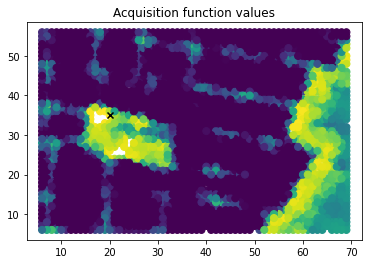

54/100
Epoch 1/200 ... Training loss: 0.8189
Epoch 10/200 ... Training loss: 0.782
Epoch 20/200 ... Training loss: 0.7361
Epoch 30/200 ... Training loss: 0.697
Epoch 40/200 ... Training loss: 0.6594
Epoch 50/200 ... Training loss: 0.6119
Epoch 60/200 ... Training loss: 0.5694
Epoch 70/200 ... Training loss: 0.5262
Epoch 80/200 ... Training loss: 0.4823
Epoch 90/200 ... Training loss: 0.4379
Epoch 100/200 ... Training loss: 0.3928
Epoch 110/200 ... Training loss: 0.3468
Epoch 120/200 ... Training loss: 0.2991
Epoch 130/200 ... Training loss: 0.2515
Epoch 140/200 ... Training loss: 0.2034
Epoch 150/200 ... Training loss: 0.1554
Epoch 160/200 ... Training loss: 0.1077
Epoch 170/200 ... Training loss: 0.0596
Epoch 180/200 ... Training loss: 0.0114
Epoch 190/200 ... Training loss: -0.0375
Epoch 200/200 ... Training loss: -0.0862


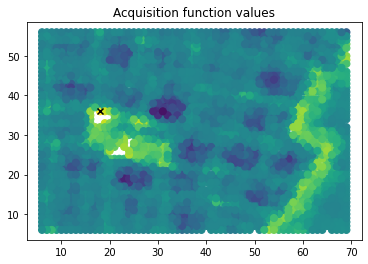

55/100
Epoch 1/200 ... Training loss: 0.8189
Epoch 10/200 ... Training loss: 0.7796
Epoch 20/200 ... Training loss: 0.7348
Epoch 30/200 ... Training loss: 0.6938
Epoch 40/200 ... Training loss: 0.6527
Epoch 50/200 ... Training loss: 0.6104
Epoch 60/200 ... Training loss: 0.5668
Epoch 70/200 ... Training loss: 0.5218
Epoch 80/200 ... Training loss: 0.4774
Epoch 90/200 ... Training loss: 0.4322
Epoch 100/200 ... Training loss: 0.3863
Epoch 110/200 ... Training loss: 0.3402
Epoch 120/200 ... Training loss: 0.2939
Epoch 130/200 ... Training loss: 0.2473
Epoch 140/200 ... Training loss: 0.2005
Epoch 150/200 ... Training loss: 0.1533
Epoch 160/200 ... Training loss: 0.1058
Epoch 170/200 ... Training loss: 0.0579
Epoch 180/200 ... Training loss: 0.0097
Epoch 190/200 ... Training loss: -0.0389
Epoch 200/200 ... Training loss: -0.0879


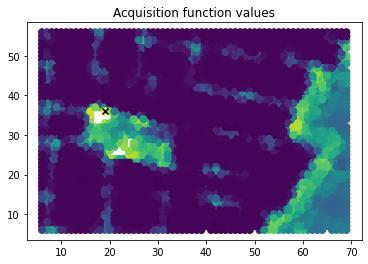

56/100
Epoch 1/200 ... Training loss: 0.8183
Epoch 10/200 ... Training loss: 0.775
Epoch 20/200 ... Training loss: 0.7356
Epoch 30/200 ... Training loss: 0.694
Epoch 40/200 ... Training loss: 0.6525
Epoch 50/200 ... Training loss: 0.6103
Epoch 60/200 ... Training loss: 0.5676
Epoch 70/200 ... Training loss: 0.5243
Epoch 80/200 ... Training loss: 0.4803
Epoch 90/200 ... Training loss: 0.4354
Epoch 100/200 ... Training loss: 0.3894
Epoch 110/200 ... Training loss: 0.3425
Epoch 120/200 ... Training loss: 0.296
Epoch 130/200 ... Training loss: 0.2488
Epoch 140/200 ... Training loss: 0.2013
Epoch 150/200 ... Training loss: 0.154
Epoch 160/200 ... Training loss: 0.1062
Epoch 170/200 ... Training loss: 0.0581
Epoch 180/200 ... Training loss: 0.0096
Epoch 190/200 ... Training loss: -0.0392
Epoch 200/200 ... Training loss: -0.0883


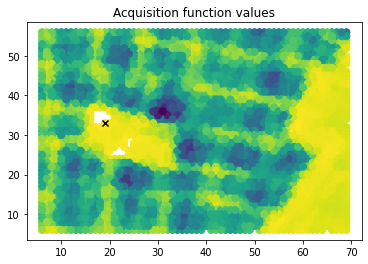

57/100
Epoch 1/200 ... Training loss: 0.8174
Epoch 10/200 ... Training loss: 0.7785
Epoch 20/200 ... Training loss: 0.7333
Epoch 30/200 ... Training loss: 0.6932
Epoch 40/200 ... Training loss: 0.6505
Epoch 50/200 ... Training loss: 0.6082
Epoch 60/200 ... Training loss: 0.5654
Epoch 70/200 ... Training loss: 0.5209
Epoch 80/200 ... Training loss: 0.4798
Epoch 90/200 ... Training loss: 0.4351
Epoch 100/200 ... Training loss: 0.3895
Epoch 110/200 ... Training loss: 0.3434
Epoch 120/200 ... Training loss: 0.2967
Epoch 130/200 ... Training loss: 0.2489
Epoch 140/200 ... Training loss: 0.2012
Epoch 150/200 ... Training loss: 0.1536
Epoch 160/200 ... Training loss: 0.1058
Epoch 170/200 ... Training loss: 0.0576
Epoch 180/200 ... Training loss: 0.0091
Epoch 190/200 ... Training loss: -0.0397
Epoch 200/200 ... Training loss: -0.0888


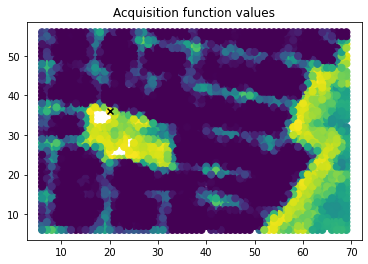

58/100
Epoch 1/200 ... Training loss: 0.8166
Epoch 10/200 ... Training loss: 0.7758
Epoch 20/200 ... Training loss: 0.7336
Epoch 30/200 ... Training loss: 0.6915
Epoch 40/200 ... Training loss: 0.65
Epoch 50/200 ... Training loss: 0.6079
Epoch 60/200 ... Training loss: 0.5653
Epoch 70/200 ... Training loss: 0.5218
Epoch 80/200 ... Training loss: 0.4773
Epoch 90/200 ... Training loss: 0.4322
Epoch 100/200 ... Training loss: 0.3862
Epoch 110/200 ... Training loss: 0.3393
Epoch 120/200 ... Training loss: 0.2926
Epoch 130/200 ... Training loss: 0.2465
Epoch 140/200 ... Training loss: 0.1991
Epoch 150/200 ... Training loss: 0.1518
Epoch 160/200 ... Training loss: 0.104
Epoch 170/200 ... Training loss: 0.056
Epoch 180/200 ... Training loss: 0.0075
Epoch 190/200 ... Training loss: -0.0413
Epoch 200/200 ... Training loss: -0.0904


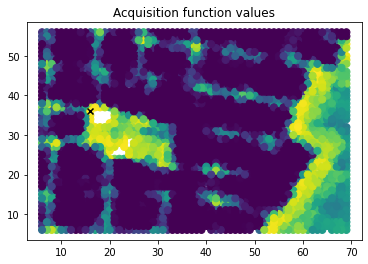

59/100
Epoch 1/200 ... Training loss: 0.8161
Epoch 10/200 ... Training loss: 0.7761
Epoch 20/200 ... Training loss: 0.7321
Epoch 30/200 ... Training loss: 0.6921
Epoch 40/200 ... Training loss: 0.6518
Epoch 50/200 ... Training loss: 0.6097
Epoch 60/200 ... Training loss: 0.5667
Epoch 70/200 ... Training loss: 0.523
Epoch 80/200 ... Training loss: 0.4777
Epoch 90/200 ... Training loss: 0.4317
Epoch 100/200 ... Training loss: 0.3854
Epoch 110/200 ... Training loss: 0.3395
Epoch 120/200 ... Training loss: 0.2934
Epoch 130/200 ... Training loss: 0.2466
Epoch 140/200 ... Training loss: 0.1988
Epoch 150/200 ... Training loss: 0.1513
Epoch 160/200 ... Training loss: 0.1034
Epoch 170/200 ... Training loss: 0.0552
Epoch 180/200 ... Training loss: 0.0067
Epoch 190/200 ... Training loss: -0.0421
Epoch 200/200 ... Training loss: -0.0885


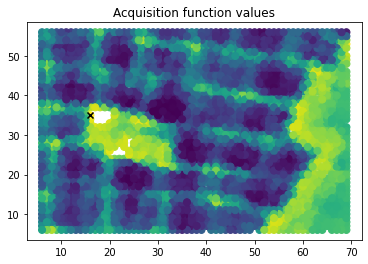

60/100
Epoch 1/200 ... Training loss: 0.8153
Epoch 10/200 ... Training loss: 0.7728
Epoch 20/200 ... Training loss: 0.733
Epoch 30/200 ... Training loss: 0.6911
Epoch 40/200 ... Training loss: 0.6491
Epoch 50/200 ... Training loss: 0.6067
Epoch 60/200 ... Training loss: 0.5634
Epoch 70/200 ... Training loss: 0.5218
Epoch 80/200 ... Training loss: 0.4793
Epoch 90/200 ... Training loss: 0.4334
Epoch 100/200 ... Training loss: 0.386
Epoch 110/200 ... Training loss: 0.34
Epoch 120/200 ... Training loss: 0.2936
Epoch 130/200 ... Training loss: 0.2463
Epoch 140/200 ... Training loss: 0.1988
Epoch 150/200 ... Training loss: 0.151
Epoch 160/200 ... Training loss: 0.1029
Epoch 170/200 ... Training loss: 0.0546
Epoch 180/200 ... Training loss: 0.0059
Epoch 190/200 ... Training loss: -0.043
Epoch 200/200 ... Training loss: -0.0923


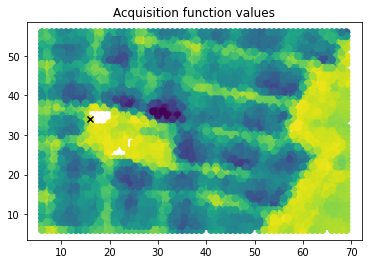

61/100
Epoch 1/200 ... Training loss: 0.8145
Epoch 10/200 ... Training loss: 0.7743
Epoch 20/200 ... Training loss: 0.7317
Epoch 30/200 ... Training loss: 0.69
Epoch 40/200 ... Training loss: 0.6496
Epoch 50/200 ... Training loss: 0.6079
Epoch 60/200 ... Training loss: 0.5653
Epoch 70/200 ... Training loss: 0.5213
Epoch 80/200 ... Training loss: 0.4753
Epoch 90/200 ... Training loss: 0.4291
Epoch 100/200 ... Training loss: 0.3868
Epoch 110/200 ... Training loss: 0.3384
Epoch 120/200 ... Training loss: 0.2916
Epoch 130/200 ... Training loss: 0.2451
Epoch 140/200 ... Training loss: 0.1978
Epoch 150/200 ... Training loss: 0.15
Epoch 160/200 ... Training loss: 0.1019
Epoch 170/200 ... Training loss: 0.0535
Epoch 180/200 ... Training loss: 0.0048
Epoch 190/200 ... Training loss: -0.0442
Epoch 200/200 ... Training loss: -0.0931


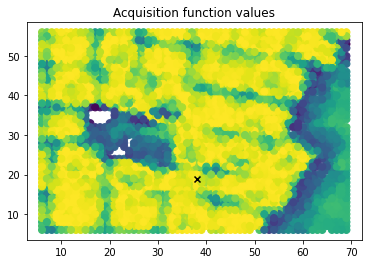

62/100
Epoch 1/200 ... Training loss: 0.8151
Epoch 10/200 ... Training loss: 0.7829
Epoch 20/200 ... Training loss: 0.7311
Epoch 30/200 ... Training loss: 0.6915
Epoch 40/200 ... Training loss: 0.6511
Epoch 50/200 ... Training loss: 0.6097
Epoch 60/200 ... Training loss: 0.5671
Epoch 70/200 ... Training loss: 0.5236
Epoch 80/200 ... Training loss: 0.479
Epoch 90/200 ... Training loss: 0.4331
Epoch 100/200 ... Training loss: 0.3878
Epoch 110/200 ... Training loss: 0.3418
Epoch 120/200 ... Training loss: 0.2949
Epoch 130/200 ... Training loss: 0.247
Epoch 140/200 ... Training loss: 0.1988
Epoch 150/200 ... Training loss: 0.1507
Epoch 160/200 ... Training loss: 0.1027
Epoch 170/200 ... Training loss: 0.0542
Epoch 180/200 ... Training loss: 0.0054
Epoch 190/200 ... Training loss: -0.0435
Epoch 200/200 ... Training loss: -0.0934


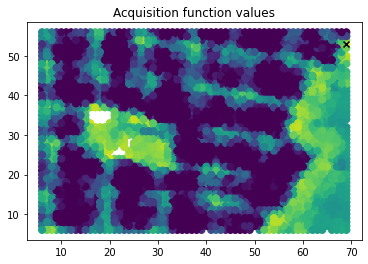

63/100
Epoch 1/200 ... Training loss: 0.8141
Epoch 10/200 ... Training loss: 0.7723
Epoch 20/200 ... Training loss: 0.7291
Epoch 30/200 ... Training loss: 0.688
Epoch 40/200 ... Training loss: 0.6467
Epoch 50/200 ... Training loss: 0.6047
Epoch 60/200 ... Training loss: 0.5623
Epoch 70/200 ... Training loss: 0.5193
Epoch 80/200 ... Training loss: 0.4747
Epoch 90/200 ... Training loss: 0.4292
Epoch 100/200 ... Training loss: 0.3829
Epoch 110/200 ... Training loss: 0.3369
Epoch 120/200 ... Training loss: 0.2904
Epoch 130/200 ... Training loss: 0.2436
Epoch 140/200 ... Training loss: 0.1966
Epoch 150/200 ... Training loss: 0.1491
Epoch 160/200 ... Training loss: 0.1012
Epoch 170/200 ... Training loss: 0.0529
Epoch 180/200 ... Training loss: 0.0043
Epoch 190/200 ... Training loss: -0.0447
Epoch 200/200 ... Training loss: -0.094


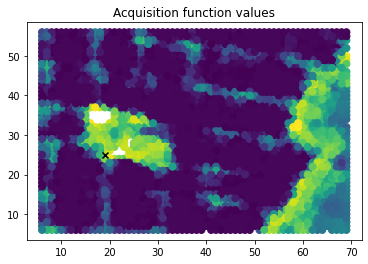

64/100
Epoch 1/200 ... Training loss: 0.8133
Epoch 10/200 ... Training loss: 0.7718
Epoch 20/200 ... Training loss: 0.7288
Epoch 30/200 ... Training loss: 0.6888
Epoch 40/200 ... Training loss: 0.6482
Epoch 50/200 ... Training loss: 0.6066
Epoch 60/200 ... Training loss: 0.5644
Epoch 70/200 ... Training loss: 0.5213
Epoch 80/200 ... Training loss: 0.4774
Epoch 90/200 ... Training loss: 0.4327
Epoch 100/200 ... Training loss: 0.3873
Epoch 110/200 ... Training loss: 0.3412
Epoch 120/200 ... Training loss: 0.2942
Epoch 130/200 ... Training loss: 0.2462
Epoch 140/200 ... Training loss: 0.1976
Epoch 150/200 ... Training loss: 0.1495
Epoch 160/200 ... Training loss: 0.1014
Epoch 170/200 ... Training loss: 0.053
Epoch 180/200 ... Training loss: 0.004
Epoch 190/200 ... Training loss: -0.0453
Epoch 200/200 ... Training loss: -0.0949


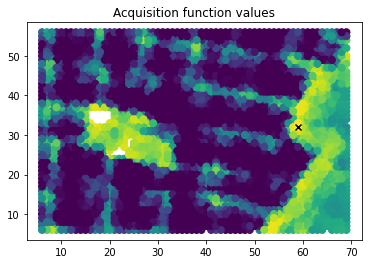

65/100
Epoch 1/200 ... Training loss: 0.8124
Epoch 10/200 ... Training loss: 0.7799
Epoch 20/200 ... Training loss: 0.7309
Epoch 30/200 ... Training loss: 0.692
Epoch 40/200 ... Training loss: 0.6502
Epoch 50/200 ... Training loss: 0.6086
Epoch 60/200 ... Training loss: 0.5664
Epoch 70/200 ... Training loss: 0.5234
Epoch 80/200 ... Training loss: 0.4794
Epoch 90/200 ... Training loss: 0.4345
Epoch 100/200 ... Training loss: 0.3876
Epoch 110/200 ... Training loss: 0.34
Epoch 120/200 ... Training loss: 0.292
Epoch 130/200 ... Training loss: 0.2479
Epoch 140/200 ... Training loss: 0.2009
Epoch 150/200 ... Training loss: 0.1642
Epoch 160/200 ... Training loss: 0.109
Epoch 170/200 ... Training loss: 0.0581
Epoch 180/200 ... Training loss: 0.0076
Epoch 190/200 ... Training loss: -0.0425
Epoch 200/200 ... Training loss: -0.0927


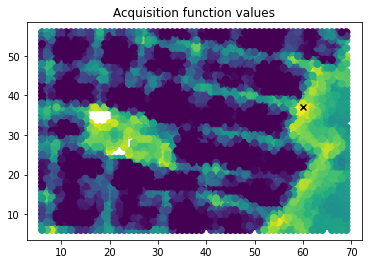

66/100
Epoch 1/200 ... Training loss: 0.8114
Epoch 10/200 ... Training loss: 0.7673
Epoch 20/200 ... Training loss: 0.7274
Epoch 30/200 ... Training loss: 0.687
Epoch 40/200 ... Training loss: 0.6454
Epoch 50/200 ... Training loss: 0.6022
Epoch 60/200 ... Training loss: 0.5569
Epoch 70/200 ... Training loss: 0.5227
Epoch 80/200 ... Training loss: 0.4791
Epoch 90/200 ... Training loss: 0.4311
Epoch 100/200 ... Training loss: 0.3843
Epoch 110/200 ... Training loss: 0.3371
Epoch 120/200 ... Training loss: 0.2902
Epoch 130/200 ... Training loss: 0.2431
Epoch 140/200 ... Training loss: 0.1957
Epoch 150/200 ... Training loss: 0.1479
Epoch 160/200 ... Training loss: 0.0998
Epoch 170/200 ... Training loss: 0.0514
Epoch 180/200 ... Training loss: 0.0025
Epoch 190/200 ... Training loss: -0.0467
Epoch 200/200 ... Training loss: -0.0962


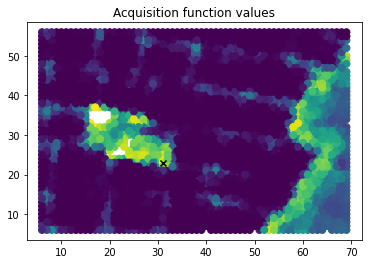

67/100
Epoch 1/200 ... Training loss: 0.8105
Epoch 10/200 ... Training loss: 0.7694
Epoch 20/200 ... Training loss: 0.7272
Epoch 30/200 ... Training loss: 0.6857
Epoch 40/200 ... Training loss: 0.6445
Epoch 50/200 ... Training loss: 0.6028
Epoch 60/200 ... Training loss: 0.56
Epoch 70/200 ... Training loss: 0.5157
Epoch 80/200 ... Training loss: 0.4706
Epoch 90/200 ... Training loss: 0.4355
Epoch 100/200 ... Training loss: 0.3892
Epoch 110/200 ... Training loss: 0.3413
Epoch 120/200 ... Training loss: 0.2946
Epoch 130/200 ... Training loss: 0.2474
Epoch 140/200 ... Training loss: 0.1992
Epoch 150/200 ... Training loss: 0.1499
Epoch 160/200 ... Training loss: 0.1011
Epoch 170/200 ... Training loss: 0.0523
Epoch 180/200 ... Training loss: 0.0032
Epoch 190/200 ... Training loss: -0.0463
Epoch 200/200 ... Training loss: -0.0961


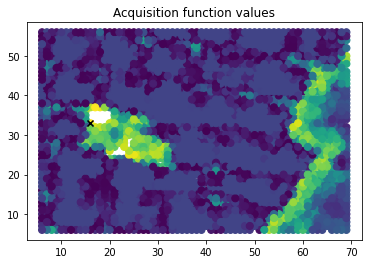

68/100
Epoch 1/200 ... Training loss: 0.8099
Epoch 10/200 ... Training loss: 0.7689
Epoch 20/200 ... Training loss: 0.7267
Epoch 30/200 ... Training loss: 0.6858
Epoch 40/200 ... Training loss: 0.6444
Epoch 50/200 ... Training loss: 0.6027
Epoch 60/200 ... Training loss: 0.5604
Epoch 70/200 ... Training loss: 0.5168
Epoch 80/200 ... Training loss: 0.4723
Epoch 90/200 ... Training loss: 0.4271
Epoch 100/200 ... Training loss: 0.3812
Epoch 110/200 ... Training loss: 0.3344
Epoch 120/200 ... Training loss: 0.2876
Epoch 130/200 ... Training loss: 0.2406
Epoch 140/200 ... Training loss: 0.1934
Epoch 150/200 ... Training loss: 0.1457
Epoch 160/200 ... Training loss: 0.0976
Epoch 170/200 ... Training loss: 0.0491
Epoch 180/200 ... Training loss: 0.0002
Epoch 190/200 ... Training loss: -0.049
Epoch 200/200 ... Training loss: -0.0986


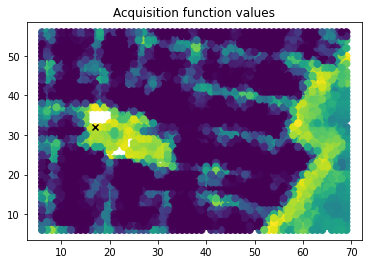

69/100
Epoch 1/200 ... Training loss: 0.8094
Epoch 10/200 ... Training loss: 0.7686
Epoch 20/200 ... Training loss: 0.7261
Epoch 30/200 ... Training loss: 0.6859
Epoch 40/200 ... Training loss: 0.6451
Epoch 50/200 ... Training loss: 0.6034
Epoch 60/200 ... Training loss: 0.5611
Epoch 70/200 ... Training loss: 0.518
Epoch 80/200 ... Training loss: 0.4739
Epoch 90/200 ... Training loss: 0.4285
Epoch 100/200 ... Training loss: 0.3814
Epoch 110/200 ... Training loss: 0.3348
Epoch 120/200 ... Training loss: 0.2878
Epoch 130/200 ... Training loss: 0.2406
Epoch 140/200 ... Training loss: 0.1932
Epoch 150/200 ... Training loss: 0.1455
Epoch 160/200 ... Training loss: 0.0973
Epoch 170/200 ... Training loss: 0.0487
Epoch 180/200 ... Training loss: -0.0001
Epoch 190/200 ... Training loss: -0.0494
Epoch 200/200 ... Training loss: -0.0992


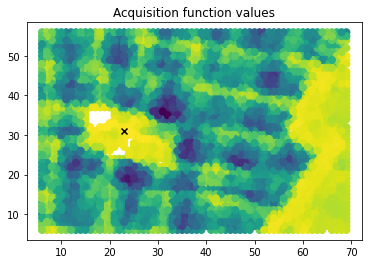

70/100
Epoch 1/200 ... Training loss: 0.8086
Epoch 10/200 ... Training loss: 0.7683
Epoch 20/200 ... Training loss: 0.7251
Epoch 30/200 ... Training loss: 0.6848
Epoch 40/200 ... Training loss: 0.6438
Epoch 50/200 ... Training loss: 0.602
Epoch 60/200 ... Training loss: 0.5595
Epoch 70/200 ... Training loss: 0.5157
Epoch 80/200 ... Training loss: 0.4733
Epoch 90/200 ... Training loss: 0.4276
Epoch 100/200 ... Training loss: 0.3813
Epoch 110/200 ... Training loss: 0.3354
Epoch 120/200 ... Training loss: 0.2875
Epoch 130/200 ... Training loss: 0.2403
Epoch 140/200 ... Training loss: 0.1929
Epoch 150/200 ... Training loss: 0.1453
Epoch 160/200 ... Training loss: 0.097
Epoch 170/200 ... Training loss: 0.0484
Epoch 180/200 ... Training loss: -0.0006
Epoch 190/200 ... Training loss: -0.0499
Epoch 200/200 ... Training loss: -0.0997


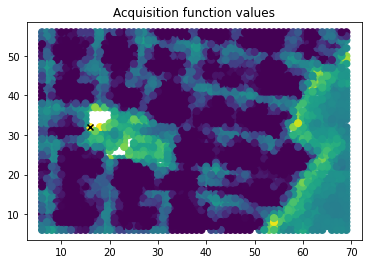

71/100
Epoch 1/200 ... Training loss: 0.808
Epoch 10/200 ... Training loss: 0.765
Epoch 20/200 ... Training loss: 0.7255
Epoch 30/200 ... Training loss: 0.686
Epoch 40/200 ... Training loss: 0.6449
Epoch 50/200 ... Training loss: 0.6031
Epoch 60/200 ... Training loss: 0.5671
Epoch 70/200 ... Training loss: 0.5201
Epoch 80/200 ... Training loss: 0.476
Epoch 90/200 ... Training loss: 0.4308
Epoch 100/200 ... Training loss: 0.3847
Epoch 110/200 ... Training loss: 0.3384
Epoch 120/200 ... Training loss: 0.2908
Epoch 130/200 ... Training loss: 0.2421
Epoch 140/200 ... Training loss: 0.1936
Epoch 150/200 ... Training loss: 0.1454
Epoch 160/200 ... Training loss: 0.097
Epoch 170/200 ... Training loss: 0.0482
Epoch 180/200 ... Training loss: -0.001
Epoch 190/200 ... Training loss: -0.0506
Epoch 200/200 ... Training loss: -0.1002


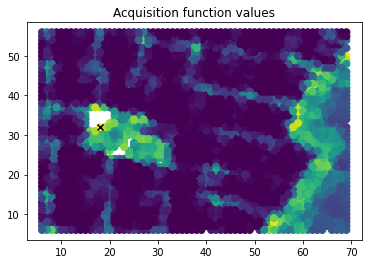

72/100
Epoch 1/200 ... Training loss: 0.8074
Epoch 10/200 ... Training loss: 0.7643
Epoch 20/200 ... Training loss: 0.7246
Epoch 30/200 ... Training loss: 0.6848
Epoch 40/200 ... Training loss: 0.6443
Epoch 50/200 ... Training loss: 0.6028
Epoch 60/200 ... Training loss: 0.5605
Epoch 70/200 ... Training loss: 0.5174
Epoch 80/200 ... Training loss: 0.4732
Epoch 90/200 ... Training loss: 0.4277
Epoch 100/200 ... Training loss: 0.3811
Epoch 110/200 ... Training loss: 0.3337
Epoch 120/200 ... Training loss: 0.286
Epoch 130/200 ... Training loss: 0.2389
Epoch 140/200 ... Training loss: 0.1917
Epoch 150/200 ... Training loss: 0.1455
Epoch 160/200 ... Training loss: 0.0958
Epoch 170/200 ... Training loss: 0.0472
Epoch 180/200 ... Training loss: -0.0018
Epoch 190/200 ... Training loss: -0.0514
Epoch 200/200 ... Training loss: -0.0677


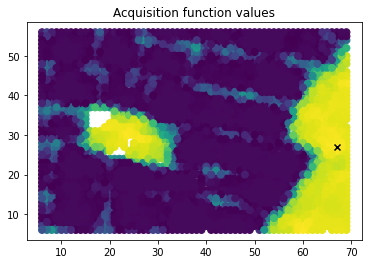

73/100
Epoch 1/200 ... Training loss: 0.8069
Epoch 10/200 ... Training loss: 0.7644
Epoch 20/200 ... Training loss: 0.7244
Epoch 30/200 ... Training loss: 0.6843
Epoch 40/200 ... Training loss: 0.6431
Epoch 50/200 ... Training loss: 0.6016
Epoch 60/200 ... Training loss: 0.5593
Epoch 70/200 ... Training loss: 0.5156
Epoch 80/200 ... Training loss: 0.4749
Epoch 90/200 ... Training loss: 0.4307
Epoch 100/200 ... Training loss: 0.3835
Epoch 110/200 ... Training loss: 0.3359
Epoch 120/200 ... Training loss: 0.2878
Epoch 130/200 ... Training loss: 0.2401
Epoch 140/200 ... Training loss: 0.1932
Epoch 150/200 ... Training loss: 0.146
Epoch 160/200 ... Training loss: 0.0966
Epoch 170/200 ... Training loss: 0.0477
Epoch 180/200 ... Training loss: -0.0016
Epoch 190/200 ... Training loss: -0.0512
Epoch 200/200 ... Training loss: -0.1012


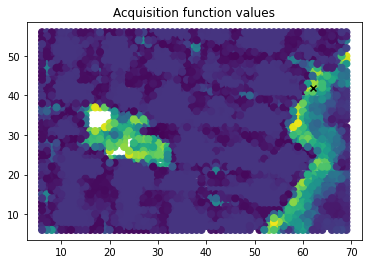

74/100
Epoch 1/200 ... Training loss: 0.8062
Epoch 10/200 ... Training loss: 0.7667
Epoch 20/200 ... Training loss: 0.7239
Epoch 30/200 ... Training loss: 0.6834
Epoch 40/200 ... Training loss: 0.6426
Epoch 50/200 ... Training loss: 0.601
Epoch 60/200 ... Training loss: 0.5598
Epoch 70/200 ... Training loss: 0.5167
Epoch 80/200 ... Training loss: 0.4727
Epoch 90/200 ... Training loss: 0.4275
Epoch 100/200 ... Training loss: 0.3808
Epoch 110/200 ... Training loss: 0.3327
Epoch 120/200 ... Training loss: 0.2854
Epoch 130/200 ... Training loss: 0.2383
Epoch 140/200 ... Training loss: 0.1908
Epoch 150/200 ... Training loss: 0.1428
Epoch 160/200 ... Training loss: 0.0945
Epoch 170/200 ... Training loss: 0.0458
Epoch 180/200 ... Training loss: -0.0034
Epoch 190/200 ... Training loss: -0.0529
Epoch 200/200 ... Training loss: -0.1028


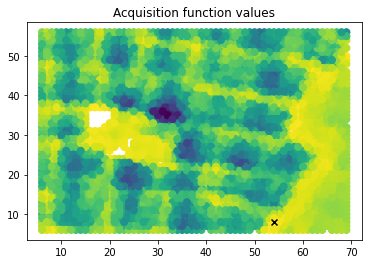

75/100
Epoch 1/200 ... Training loss: 0.8055
Epoch 10/200 ... Training loss: 0.765
Epoch 20/200 ... Training loss: 0.724
Epoch 30/200 ... Training loss: 0.6829
Epoch 40/200 ... Training loss: 0.6408
Epoch 50/200 ... Training loss: 0.602
Epoch 60/200 ... Training loss: 0.5607
Epoch 70/200 ... Training loss: 0.518
Epoch 80/200 ... Training loss: 0.4745
Epoch 90/200 ... Training loss: 0.4304
Epoch 100/200 ... Training loss: 0.3855
Epoch 110/200 ... Training loss: 0.3395
Epoch 120/200 ... Training loss: 0.2922
Epoch 130/200 ... Training loss: 0.2434
Epoch 140/200 ... Training loss: 0.1937
Epoch 150/200 ... Training loss: 0.1448
Epoch 160/200 ... Training loss: 0.0962
Epoch 170/200 ... Training loss: 0.0472
Epoch 180/200 ... Training loss: -0.0021
Epoch 190/200 ... Training loss: -0.0519
Epoch 200/200 ... Training loss: -0.1019


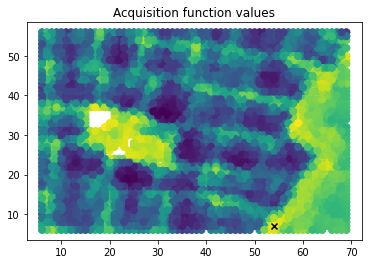

76/100
Epoch 1/200 ... Training loss: 0.8053
Epoch 10/200 ... Training loss: 0.7623
Epoch 20/200 ... Training loss: 0.7225
Epoch 30/200 ... Training loss: 0.6827
Epoch 40/200 ... Training loss: 0.6417
Epoch 50/200 ... Training loss: 0.5989
Epoch 60/200 ... Training loss: 0.5547
Epoch 70/200 ... Training loss: 0.5224
Epoch 80/200 ... Training loss: 0.4787
Epoch 90/200 ... Training loss: 0.4335
Epoch 100/200 ... Training loss: 0.3881
Epoch 110/200 ... Training loss: 0.3425
Epoch 120/200 ... Training loss: 0.2966
Epoch 130/200 ... Training loss: 0.2501
Epoch 140/200 ... Training loss: 0.203
Epoch 150/200 ... Training loss: 0.1555
Epoch 160/200 ... Training loss: 0.1076
Epoch 170/200 ... Training loss: 0.0593
Epoch 180/200 ... Training loss: 0.0107
Epoch 190/200 ... Training loss: -0.0377
Epoch 200/200 ... Training loss: -0.0865


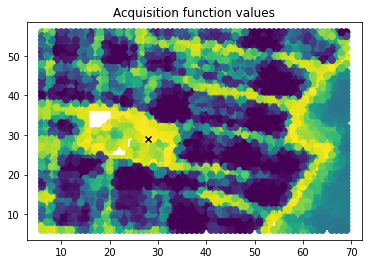

77/100
Epoch 1/200 ... Training loss: 0.8047
Epoch 10/200 ... Training loss: 0.7626
Epoch 20/200 ... Training loss: 0.7227
Epoch 30/200 ... Training loss: 0.6818
Epoch 40/200 ... Training loss: 0.6411
Epoch 50/200 ... Training loss: 0.5997
Epoch 60/200 ... Training loss: 0.5575
Epoch 70/200 ... Training loss: 0.5142
Epoch 80/200 ... Training loss: 0.4697
Epoch 90/200 ... Training loss: 0.4241
Epoch 100/200 ... Training loss: 0.3871
Epoch 110/200 ... Training loss: 0.3373
Epoch 120/200 ... Training loss: 0.2881
Epoch 130/200 ... Training loss: 0.2395
Epoch 140/200 ... Training loss: 0.1911
Epoch 150/200 ... Training loss: 0.1426
Epoch 160/200 ... Training loss: 0.0939
Epoch 170/200 ... Training loss: 0.045
Epoch 180/200 ... Training loss: -0.0044
Epoch 190/200 ... Training loss: -0.0542
Epoch 200/200 ... Training loss: -0.1042


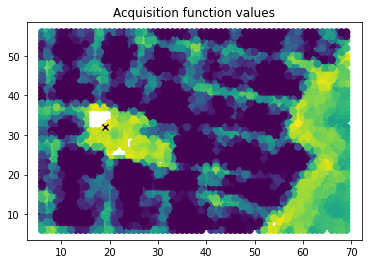

78/100
Epoch 1/200 ... Training loss: 0.8041
Epoch 10/200 ... Training loss: 0.7635
Epoch 20/200 ... Training loss: 0.7224
Epoch 30/200 ... Training loss: 0.6958
Epoch 40/200 ... Training loss: 0.6411
Epoch 50/200 ... Training loss: 0.5998
Epoch 60/200 ... Training loss: 0.5573
Epoch 70/200 ... Training loss: 0.5132
Epoch 80/200 ... Training loss: 0.4675
Epoch 90/200 ... Training loss: 0.4309
Epoch 100/200 ... Training loss: 0.3865
Epoch 110/200 ... Training loss: 0.3387
Epoch 120/200 ... Training loss: 0.2896
Epoch 130/200 ... Training loss: 0.2401
Epoch 140/200 ... Training loss: 0.1912
Epoch 150/200 ... Training loss: 0.143
Epoch 160/200 ... Training loss: 0.0961
Epoch 170/200 ... Training loss: 0.0458
Epoch 180/200 ... Training loss: -0.0038
Epoch 190/200 ... Training loss: -0.0538
Epoch 200/200 ... Training loss: -0.104


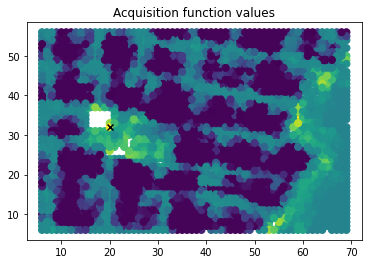

79/100
Epoch 1/200 ... Training loss: 0.8036
Epoch 10/200 ... Training loss: 0.7695
Epoch 20/200 ... Training loss: 0.7387
Epoch 30/200 ... Training loss: 0.6825
Epoch 40/200 ... Training loss: 0.642
Epoch 50/200 ... Training loss: 0.6012
Epoch 60/200 ... Training loss: 0.5592
Epoch 70/200 ... Training loss: 0.5164
Epoch 80/200 ... Training loss: 0.4727
Epoch 90/200 ... Training loss: 0.4277
Epoch 100/200 ... Training loss: 0.3817
Epoch 110/200 ... Training loss: 0.3353
Epoch 120/200 ... Training loss: 0.2876
Epoch 130/200 ... Training loss: 0.2385
Epoch 140/200 ... Training loss: 0.1895
Epoch 150/200 ... Training loss: 0.1411
Epoch 160/200 ... Training loss: 0.0925
Epoch 170/200 ... Training loss: 0.0435
Epoch 180/200 ... Training loss: -0.0059
Epoch 190/200 ... Training loss: -0.0557
Epoch 200/200 ... Training loss: -0.106


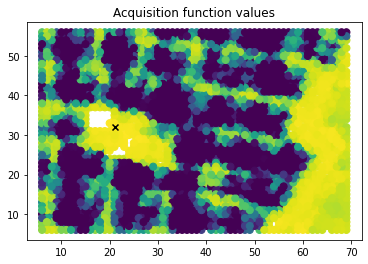

80/100
Epoch 1/200 ... Training loss: 0.8031
Epoch 10/200 ... Training loss: 0.7626
Epoch 20/200 ... Training loss: 0.7208
Epoch 30/200 ... Training loss: 0.68
Epoch 40/200 ... Training loss: 0.6391
Epoch 50/200 ... Training loss: 0.5976
Epoch 60/200 ... Training loss: 0.5552
Epoch 70/200 ... Training loss: 0.5115
Epoch 80/200 ... Training loss: 0.4666
Epoch 90/200 ... Training loss: 0.4255
Epoch 100/200 ... Training loss: 0.3775
Epoch 110/200 ... Training loss: 0.33
Epoch 120/200 ... Training loss: 0.2826
Epoch 130/200 ... Training loss: 0.2352
Epoch 140/200 ... Training loss: 0.1877
Epoch 150/200 ... Training loss: 0.1397
Epoch 160/200 ... Training loss: 0.0913
Epoch 170/200 ... Training loss: 0.0424
Epoch 180/200 ... Training loss: -0.0068
Epoch 190/200 ... Training loss: -0.0563
Epoch 200/200 ... Training loss: -0.1063


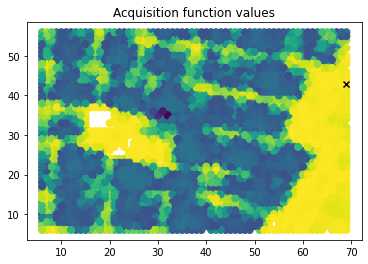

81/100
Epoch 1/200 ... Training loss: 0.8028
Epoch 10/200 ... Training loss: 0.7607
Epoch 20/200 ... Training loss: 0.7205
Epoch 30/200 ... Training loss: 0.6806
Epoch 40/200 ... Training loss: 0.6395
Epoch 50/200 ... Training loss: 0.5968
Epoch 60/200 ... Training loss: 0.5588
Epoch 70/200 ... Training loss: 0.5176
Epoch 80/200 ... Training loss: 0.4739
Epoch 90/200 ... Training loss: 0.4294
Epoch 100/200 ... Training loss: 0.3842
Epoch 110/200 ... Training loss: 0.3381
Epoch 120/200 ... Training loss: 0.2912
Epoch 130/200 ... Training loss: 0.2432
Epoch 140/200 ... Training loss: 0.1936
Epoch 150/200 ... Training loss: 0.1433
Epoch 160/200 ... Training loss: 0.0939
Epoch 170/200 ... Training loss: 0.0447
Epoch 180/200 ... Training loss: -0.0051
Epoch 190/200 ... Training loss: -0.0551
Epoch 200/200 ... Training loss: -0.1055


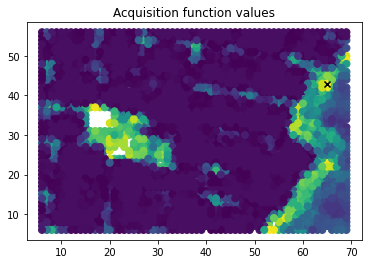

82/100
Epoch 1/200 ... Training loss: 0.8023
Epoch 10/200 ... Training loss: 0.762
Epoch 20/200 ... Training loss: 0.7199
Epoch 30/200 ... Training loss: 0.6797
Epoch 40/200 ... Training loss: 0.639
Epoch 50/200 ... Training loss: 0.5975
Epoch 60/200 ... Training loss: 0.5554
Epoch 70/200 ... Training loss: 0.5124
Epoch 80/200 ... Training loss: 0.4673
Epoch 90/200 ... Training loss: 0.4256
Epoch 100/200 ... Training loss: 0.3775
Epoch 110/200 ... Training loss: 0.3292
Epoch 120/200 ... Training loss: 0.2821
Epoch 130/200 ... Training loss: 0.2347
Epoch 140/200 ... Training loss: 0.187
Epoch 150/200 ... Training loss: 0.1389
Epoch 160/200 ... Training loss: 0.0904
Epoch 170/200 ... Training loss: 0.0414
Epoch 180/200 ... Training loss: -0.0079
Epoch 190/200 ... Training loss: -0.0576
Epoch 200/200 ... Training loss: -0.1076


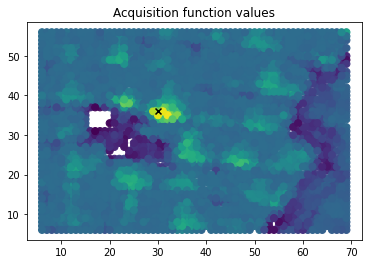

83/100
Epoch 1/200 ... Training loss: 0.8032
Epoch 10/200 ... Training loss: 0.7764
Epoch 20/200 ... Training loss: 0.7204
Epoch 30/200 ... Training loss: 0.6807
Epoch 40/200 ... Training loss: 0.6404
Epoch 50/200 ... Training loss: 0.5993
Epoch 60/200 ... Training loss: 0.5576
Epoch 70/200 ... Training loss: 0.5148
Epoch 80/200 ... Training loss: 0.47
Epoch 90/200 ... Training loss: 0.4239
Epoch 100/200 ... Training loss: 0.3761
Epoch 110/200 ... Training loss: 0.3292
Epoch 120/200 ... Training loss: 0.286
Epoch 130/200 ... Training loss: 0.2375
Epoch 140/200 ... Training loss: 0.189
Epoch 150/200 ... Training loss: 0.1407
Epoch 160/200 ... Training loss: 0.0916
Epoch 170/200 ... Training loss: 0.0421
Epoch 180/200 ... Training loss: -0.007
Epoch 190/200 ... Training loss: -0.0474
Epoch 200/200 ... Training loss: -0.104


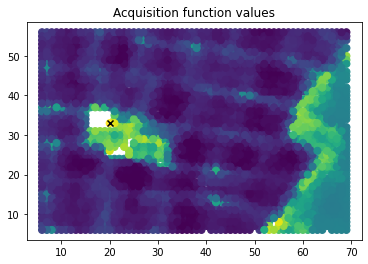

84/100
Epoch 1/200 ... Training loss: 0.8026
Epoch 10/200 ... Training loss: 0.7579
Epoch 20/200 ... Training loss: 0.7234
Epoch 30/200 ... Training loss: 0.68
Epoch 40/200 ... Training loss: 0.6395
Epoch 50/200 ... Training loss: 0.5984
Epoch 60/200 ... Training loss: 0.5566
Epoch 70/200 ... Training loss: 0.5139
Epoch 80/200 ... Training loss: 0.4691
Epoch 90/200 ... Training loss: 0.4236
Epoch 100/200 ... Training loss: 0.3761
Epoch 110/200 ... Training loss: 0.3319
Epoch 120/200 ... Training loss: 0.298
Epoch 130/200 ... Training loss: 0.2541
Epoch 140/200 ... Training loss: 0.2065
Epoch 150/200 ... Training loss: 0.1571
Epoch 160/200 ... Training loss: 0.1063
Epoch 170/200 ... Training loss: 0.0548
Epoch 180/200 ... Training loss: 0.0011
Epoch 190/200 ... Training loss: -0.0513
Epoch 200/200 ... Training loss: -0.1024


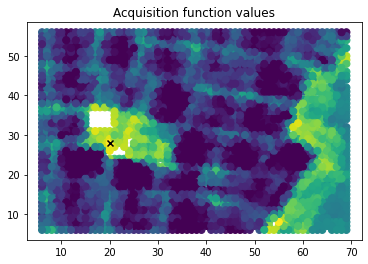

85/100
Epoch 1/200 ... Training loss: 0.8023
Epoch 10/200 ... Training loss: 0.7621
Epoch 20/200 ... Training loss: 0.7189
Epoch 30/200 ... Training loss: 0.6788
Epoch 40/200 ... Training loss: 0.6383
Epoch 50/200 ... Training loss: 0.5973
Epoch 60/200 ... Training loss: 0.5556
Epoch 70/200 ... Training loss: 0.5127
Epoch 80/200 ... Training loss: 0.4682
Epoch 90/200 ... Training loss: 0.4227
Epoch 100/200 ... Training loss: 0.3761
Epoch 110/200 ... Training loss: 0.3281
Epoch 120/200 ... Training loss: 0.2809
Epoch 130/200 ... Training loss: 0.2335
Epoch 140/200 ... Training loss: 0.1863
Epoch 150/200 ... Training loss: 0.1381
Epoch 160/200 ... Training loss: 0.0895
Epoch 170/200 ... Training loss: 0.0404
Epoch 180/200 ... Training loss: -0.0089
Epoch 190/200 ... Training loss: -0.0567
Epoch 200/200 ... Training loss: -0.0861


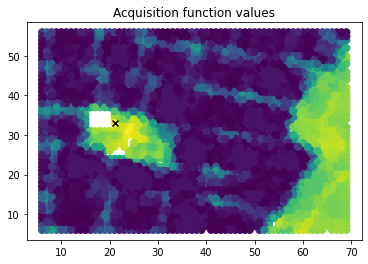

86/100
Epoch 1/200 ... Training loss: 0.8018
Epoch 10/200 ... Training loss: 0.7623
Epoch 20/200 ... Training loss: 0.7184
Epoch 30/200 ... Training loss: 0.6785
Epoch 40/200 ... Training loss: 0.638
Epoch 50/200 ... Training loss: 0.5968
Epoch 60/200 ... Training loss: 0.555
Epoch 70/200 ... Training loss: 0.5123
Epoch 80/200 ... Training loss: 0.468
Epoch 90/200 ... Training loss: 0.4223
Epoch 100/200 ... Training loss: 0.3753
Epoch 110/200 ... Training loss: 0.3374
Epoch 120/200 ... Training loss: 0.2879
Epoch 130/200 ... Training loss: 0.2396
Epoch 140/200 ... Training loss: 0.1898
Epoch 150/200 ... Training loss: 0.1407
Epoch 160/200 ... Training loss: 0.0914
Epoch 170/200 ... Training loss: 0.0424
Epoch 180/200 ... Training loss: -0.0078
Epoch 190/200 ... Training loss: -0.0577
Epoch 200/200 ... Training loss: -0.0728


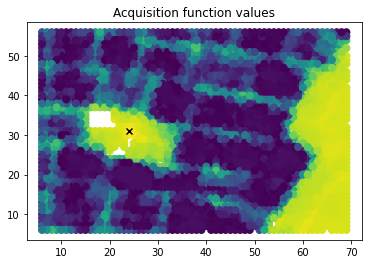

87/100
Epoch 1/200 ... Training loss: 0.8012
Epoch 10/200 ... Training loss: 0.7625
Epoch 20/200 ... Training loss: 0.7188
Epoch 30/200 ... Training loss: 0.6789
Epoch 40/200 ... Training loss: 0.6385
Epoch 50/200 ... Training loss: 0.5973
Epoch 60/200 ... Training loss: 0.5555
Epoch 70/200 ... Training loss: 0.513
Epoch 80/200 ... Training loss: 0.4698
Epoch 90/200 ... Training loss: 0.4253
Epoch 100/200 ... Training loss: 0.3785
Epoch 110/200 ... Training loss: 0.3298
Epoch 120/200 ... Training loss: 0.2812
Epoch 130/200 ... Training loss: 0.2357
Epoch 140/200 ... Training loss: 0.1872
Epoch 150/200 ... Training loss: 0.1387
Epoch 160/200 ... Training loss: 0.0897
Epoch 170/200 ... Training loss: 0.0431
Epoch 180/200 ... Training loss: -0.0076
Epoch 190/200 ... Training loss: -0.0582
Epoch 200/200 ... Training loss: -0.1088


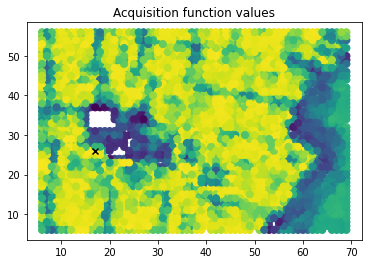

88/100
Epoch 1/200 ... Training loss: 0.8013
Epoch 10/200 ... Training loss: 0.7639
Epoch 20/200 ... Training loss: 0.7189
Epoch 30/200 ... Training loss: 0.6788
Epoch 40/200 ... Training loss: 0.6387
Epoch 50/200 ... Training loss: 0.5971
Epoch 60/200 ... Training loss: 0.5551
Epoch 70/200 ... Training loss: 0.5123
Epoch 80/200 ... Training loss: 0.4685
Epoch 90/200 ... Training loss: 0.4234
Epoch 100/200 ... Training loss: 0.3772
Epoch 110/200 ... Training loss: 0.3301
Epoch 120/200 ... Training loss: 0.2817
Epoch 130/200 ... Training loss: 0.2333
Epoch 140/200 ... Training loss: 0.1851
Epoch 150/200 ... Training loss: 0.1369
Epoch 160/200 ... Training loss: 0.088
Epoch 170/200 ... Training loss: 0.0388
Epoch 180/200 ... Training loss: -0.0108
Epoch 190/200 ... Training loss: -0.0603
Epoch 200/200 ... Training loss: -0.1106


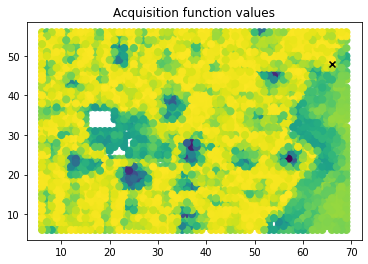

89/100
Epoch 1/200 ... Training loss: 0.8016
Epoch 10/200 ... Training loss: 0.7631
Epoch 20/200 ... Training loss: 0.7192
Epoch 30/200 ... Training loss: 0.6787
Epoch 40/200 ... Training loss: 0.6378
Epoch 50/200 ... Training loss: 0.5964
Epoch 60/200 ... Training loss: 0.554
Epoch 70/200 ... Training loss: 0.5103
Epoch 80/200 ... Training loss: 0.4656
Epoch 90/200 ... Training loss: 0.4203
Epoch 100/200 ... Training loss: 0.3739
Epoch 110/200 ... Training loss: 0.3264
Epoch 120/200 ... Training loss: 0.2788
Epoch 130/200 ... Training loss: 0.2312
Epoch 140/200 ... Training loss: 0.1834
Epoch 150/200 ... Training loss: 0.1351
Epoch 160/200 ... Training loss: 0.0866
Epoch 170/200 ... Training loss: 0.0373
Epoch 180/200 ... Training loss: -0.0122
Epoch 190/200 ... Training loss: -0.0617
Epoch 200/200 ... Training loss: -0.1122


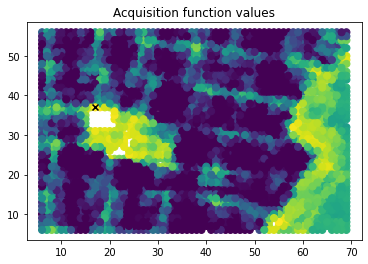

90/100
Epoch 1/200 ... Training loss: 0.8012
Epoch 10/200 ... Training loss: 0.7632
Epoch 20/200 ... Training loss: 0.7185
Epoch 30/200 ... Training loss: 0.6786
Epoch 40/200 ... Training loss: 0.6378
Epoch 50/200 ... Training loss: 0.5961
Epoch 60/200 ... Training loss: 0.5536
Epoch 70/200 ... Training loss: 0.5102
Epoch 80/200 ... Training loss: 0.4658
Epoch 90/200 ... Training loss: 0.4204
Epoch 100/200 ... Training loss: 0.3733
Epoch 110/200 ... Training loss: 0.3313
Epoch 120/200 ... Training loss: 0.282
Epoch 130/200 ... Training loss: 0.2331
Epoch 140/200 ... Training loss: 0.1847
Epoch 150/200 ... Training loss: 0.1361
Epoch 160/200 ... Training loss: 0.0873
Epoch 170/200 ... Training loss: 0.038
Epoch 180/200 ... Training loss: -0.0116
Epoch 190/200 ... Training loss: -0.0615
Epoch 200/200 ... Training loss: -0.1118


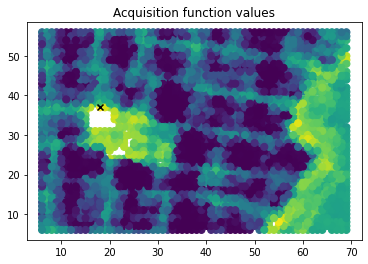

91/100
Epoch 1/200 ... Training loss: 0.8008
Epoch 10/200 ... Training loss: 0.7617
Epoch 20/200 ... Training loss: 0.7185
Epoch 30/200 ... Training loss: 0.6788
Epoch 40/200 ... Training loss: 0.6379
Epoch 50/200 ... Training loss: 0.5958
Epoch 60/200 ... Training loss: 0.5515
Epoch 70/200 ... Training loss: 0.5075
Epoch 80/200 ... Training loss: 0.4629
Epoch 90/200 ... Training loss: 0.4174
Epoch 100/200 ... Training loss: 0.3708
Epoch 110/200 ... Training loss: 0.324
Epoch 120/200 ... Training loss: 0.2771
Epoch 130/200 ... Training loss: 0.2299
Epoch 140/200 ... Training loss: 0.1824
Epoch 150/200 ... Training loss: 0.1341
Epoch 160/200 ... Training loss: 0.0855
Epoch 170/200 ... Training loss: 0.0364
Epoch 180/200 ... Training loss: -0.013
Epoch 190/200 ... Training loss: -0.063
Epoch 200/200 ... Training loss: -0.1131


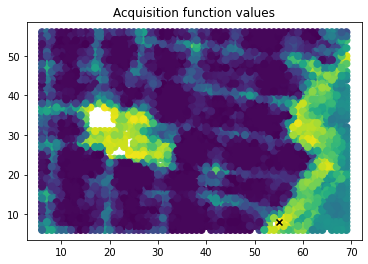

92/100
Epoch 1/200 ... Training loss: 0.8002
Epoch 10/200 ... Training loss: 0.7608
Epoch 20/200 ... Training loss: 0.7182
Epoch 30/200 ... Training loss: 0.6779
Epoch 40/200 ... Training loss: 0.637
Epoch 50/200 ... Training loss: 0.5952
Epoch 60/200 ... Training loss: 0.5522
Epoch 70/200 ... Training loss: 0.5079
Epoch 80/200 ... Training loss: 0.4628
Epoch 90/200 ... Training loss: 0.4166
Epoch 100/200 ... Training loss: 0.3702
Epoch 110/200 ... Training loss: 0.3307
Epoch 120/200 ... Training loss: 0.2838
Epoch 130/200 ... Training loss: 0.2333
Epoch 140/200 ... Training loss: 0.1844
Epoch 150/200 ... Training loss: 0.1354
Epoch 160/200 ... Training loss: 0.0865
Epoch 170/200 ... Training loss: 0.0371
Epoch 180/200 ... Training loss: -0.0125
Epoch 190/200 ... Training loss: -0.0625
Epoch 200/200 ... Training loss: -0.1129


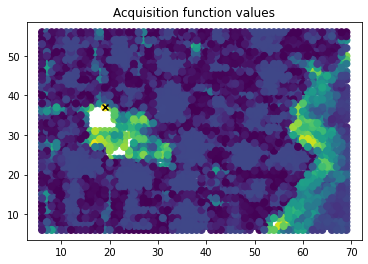

93/100
Epoch 1/200 ... Training loss: 0.7999
Epoch 10/200 ... Training loss: 0.7603
Epoch 20/200 ... Training loss: 0.7175
Epoch 30/200 ... Training loss: 0.6773
Epoch 40/200 ... Training loss: 0.6366
Epoch 50/200 ... Training loss: 0.5951
Epoch 60/200 ... Training loss: 0.5526
Epoch 70/200 ... Training loss: 0.509
Epoch 80/200 ... Training loss: 0.4641
Epoch 90/200 ... Training loss: 0.4179
Epoch 100/200 ... Training loss: 0.3719
Epoch 110/200 ... Training loss: 0.3374
Epoch 120/200 ... Training loss: 0.2868
Epoch 130/200 ... Training loss: 0.2381
Epoch 140/200 ... Training loss: 0.1884
Epoch 150/200 ... Training loss: 0.1389
Epoch 160/200 ... Training loss: 0.0891
Epoch 170/200 ... Training loss: 0.0393
Epoch 180/200 ... Training loss: -0.0108
Epoch 190/200 ... Training loss: -0.0611
Epoch 200/200 ... Training loss: -0.1116


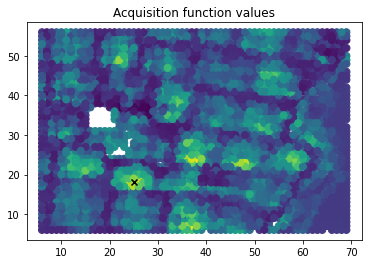

94/100
Epoch 1/200 ... Training loss: 0.8003
Epoch 10/200 ... Training loss: 0.7549
Epoch 20/200 ... Training loss: 0.7196
Epoch 30/200 ... Training loss: 0.6767
Epoch 40/200 ... Training loss: 0.6363
Epoch 50/200 ... Training loss: 0.5946
Epoch 60/200 ... Training loss: 0.5518
Epoch 70/200 ... Training loss: 0.5079
Epoch 80/200 ... Training loss: 0.4627
Epoch 90/200 ... Training loss: 0.4209
Epoch 100/200 ... Training loss: 0.3747
Epoch 110/200 ... Training loss: 0.3279
Epoch 120/200 ... Training loss: 0.2797
Epoch 130/200 ... Training loss: 0.2315
Epoch 140/200 ... Training loss: 0.1834
Epoch 150/200 ... Training loss: 0.135
Epoch 160/200 ... Training loss: 0.0861
Epoch 170/200 ... Training loss: 0.0369
Epoch 180/200 ... Training loss: -0.0129
Epoch 190/200 ... Training loss: -0.0629
Epoch 200/200 ... Training loss: -0.1133


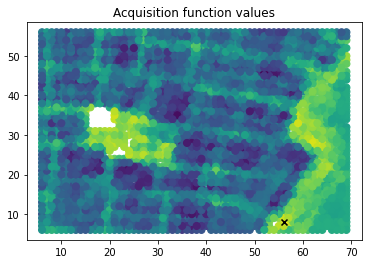

95/100
Epoch 1/200 ... Training loss: 0.7997
Epoch 10/200 ... Training loss: 0.7548
Epoch 20/200 ... Training loss: 0.716
Epoch 30/200 ... Training loss: 0.677
Epoch 40/200 ... Training loss: 0.6362
Epoch 50/200 ... Training loss: 0.5941
Epoch 60/200 ... Training loss: 0.5512
Epoch 70/200 ... Training loss: 0.5073
Epoch 80/200 ... Training loss: 0.4627
Epoch 90/200 ... Training loss: 0.4165
Epoch 100/200 ... Training loss: 0.3703
Epoch 110/200 ... Training loss: 0.3238
Epoch 120/200 ... Training loss: 0.277
Epoch 130/200 ... Training loss: 0.2298
Epoch 140/200 ... Training loss: 0.182
Epoch 150/200 ... Training loss: 0.1337
Epoch 160/200 ... Training loss: 0.0853
Epoch 170/200 ... Training loss: 0.0369
Epoch 180/200 ... Training loss: -0.0135
Epoch 190/200 ... Training loss: -0.0633
Epoch 200/200 ... Training loss: -0.1133


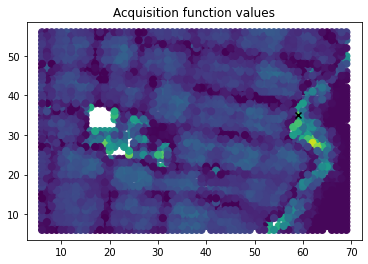

96/100
Epoch 1/200 ... Training loss: 0.7992
Epoch 10/200 ... Training loss: 0.7544
Epoch 20/200 ... Training loss: 0.7178
Epoch 30/200 ... Training loss: 0.6772
Epoch 40/200 ... Training loss: 0.637
Epoch 50/200 ... Training loss: 0.5956
Epoch 60/200 ... Training loss: 0.5532
Epoch 70/200 ... Training loss: 0.5079
Epoch 80/200 ... Training loss: 0.4632
Epoch 90/200 ... Training loss: 0.4169
Epoch 100/200 ... Training loss: 0.3831
Epoch 110/200 ... Training loss: 0.3359
Epoch 120/200 ... Training loss: 0.2872
Epoch 130/200 ... Training loss: 0.2386
Epoch 140/200 ... Training loss: 0.1891
Epoch 150/200 ... Training loss: 0.1485
Epoch 160/200 ... Training loss: 0.0965
Epoch 170/200 ... Training loss: 0.0445
Epoch 180/200 ... Training loss: -0.007
Epoch 190/200 ... Training loss: -0.0582
Epoch 200/200 ... Training loss: -0.1095


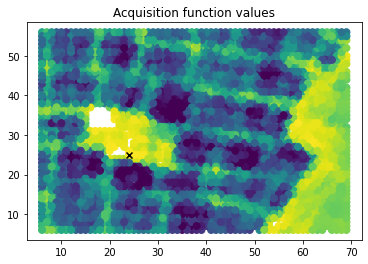

97/100
Epoch 1/200 ... Training loss: 0.7988
Epoch 10/200 ... Training loss: 0.7545
Epoch 20/200 ... Training loss: 0.7152
Epoch 30/200 ... Training loss: 0.6782
Epoch 40/200 ... Training loss: 0.6372
Epoch 50/200 ... Training loss: 0.5959
Epoch 60/200 ... Training loss: 0.5534
Epoch 70/200 ... Training loss: 0.5102
Epoch 80/200 ... Training loss: 0.4656
Epoch 90/200 ... Training loss: 0.4203
Epoch 100/200 ... Training loss: 0.3741
Epoch 110/200 ... Training loss: 0.3267
Epoch 120/200 ... Training loss: 0.2783
Epoch 130/200 ... Training loss: 0.2304
Epoch 140/200 ... Training loss: 0.182
Epoch 150/200 ... Training loss: 0.1334
Epoch 160/200 ... Training loss: 0.0845
Epoch 170/200 ... Training loss: 0.0351
Epoch 180/200 ... Training loss: -0.0145
Epoch 190/200 ... Training loss: -0.0648
Epoch 200/200 ... Training loss: -0.1152


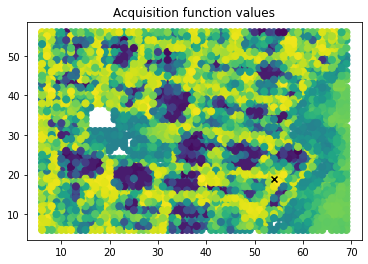

98/100
Epoch 1/200 ... Training loss: 0.798
Epoch 10/200 ... Training loss: 0.7529
Epoch 20/200 ... Training loss: 0.7156
Epoch 30/200 ... Training loss: 0.6783
Epoch 40/200 ... Training loss: 0.6368
Epoch 50/200 ... Training loss: 0.5971
Epoch 60/200 ... Training loss: 0.5548
Epoch 70/200 ... Training loss: 0.5117
Epoch 80/200 ... Training loss: 0.4676
Epoch 90/200 ... Training loss: 0.4225
Epoch 100/200 ... Training loss: 0.3767
Epoch 110/200 ... Training loss: 0.3297
Epoch 120/200 ... Training loss: 0.2811
Epoch 130/200 ... Training loss: 0.2322
Epoch 140/200 ... Training loss: 0.1838
Epoch 150/200 ... Training loss: 0.1352
Epoch 160/200 ... Training loss: 0.0859
Epoch 170/200 ... Training loss: 0.0363
Epoch 180/200 ... Training loss: -0.0129
Epoch 190/200 ... Training loss: -0.0638
Epoch 200/200 ... Training loss: -0.1145


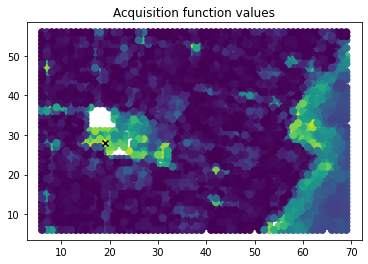

99/100
Epoch 1/200 ... Training loss: 0.7977
Epoch 10/200 ... Training loss: 0.7523
Epoch 20/200 ... Training loss: 0.7171
Epoch 30/200 ... Training loss: 0.6765
Epoch 40/200 ... Training loss: 0.6359
Epoch 50/200 ... Training loss: 0.5943
Epoch 60/200 ... Training loss: 0.552
Epoch 70/200 ... Training loss: 0.5085
Epoch 80/200 ... Training loss: 0.4641
Epoch 90/200 ... Training loss: 0.4189
Epoch 100/200 ... Training loss: 0.3728
Epoch 110/200 ... Training loss: 0.3252
Epoch 120/200 ... Training loss: 0.2773
Epoch 130/200 ... Training loss: 0.2293
Epoch 140/200 ... Training loss: 0.1812
Epoch 150/200 ... Training loss: 0.133
Epoch 160/200 ... Training loss: 0.0839
Epoch 170/200 ... Training loss: 0.0344
Epoch 180/200 ... Training loss: -0.0154
Epoch 190/200 ... Training loss: -0.0655
Epoch 200/200 ... Training loss: -0.1161


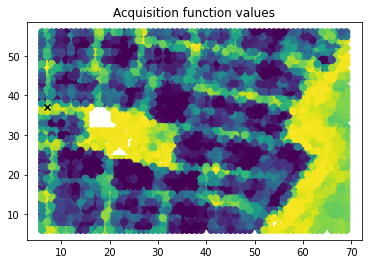

100/100
Epoch 1/200 ... Training loss: 0.7974
Epoch 10/200 ... Training loss: 0.766
Epoch 20/200 ... Training loss: 0.716
Epoch 30/200 ... Training loss: 0.6742
Epoch 40/200 ... Training loss: 0.6327
Epoch 50/200 ... Training loss: 0.5909
Epoch 60/200 ... Training loss: 0.5483
Epoch 70/200 ... Training loss: 0.5043
Epoch 80/200 ... Training loss: 0.4596
Epoch 90/200 ... Training loss: 0.4138
Epoch 100/200 ... Training loss: 0.3766
Epoch 110/200 ... Training loss: 0.3264
Epoch 120/200 ... Training loss: 0.2782
Epoch 130/200 ... Training loss: 0.23
Epoch 140/200 ... Training loss: 0.1817
Epoch 150/200 ... Training loss: 0.1331
Epoch 160/200 ... Training loss: 0.0841
Epoch 170/200 ... Training loss: 0.0347
Epoch 180/200 ... Training loss: -0.0151
Epoch 190/200 ... Training loss: -0.0653
Epoch 200/200 ... Training loss: -0.1156


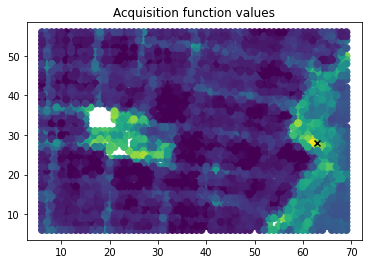

In [32]:
def plot_result(indices, obj):
    plt.scatter(indices[:, 1], indices[:, 0], s=50, c=obj)
    next_point = indices_test[obj.argmax()]
    plt.scatter(next_point[1], next_point[0], marker='x', c='k')
    plt.title("Acquisition function values")
    plt.show()


data_dim = X_train.shape[-1]

exploration_steps = 100

for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    # update GP posterior
    dklgp2 = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
    dklgp2.fit(X_train, y_train, training_cycles=200)
    # Thompson sampling
    obj, next_point_idx = dklgp2.thompson(X_test)
    # Select next point to "measure"
    next_point = indices_test[next_point_idx]
    # Do "measurement"
    measured_point = y_test[next_point_idx]
    # Plot current result
    plot_result(indices_test, obj)
    # Append to the arrays of measured points
    X_train = np.append(X_train, X_test[next_point_idx], 0)
    X_test = np.delete(X_test, next_point_idx, 0)
    y_train = np.append(y_train, measured_point)
    y_test = np.delete(y_test, next_point_idx)
    indices_train = np.append(indices_train, next_point, 0)
    indices_test = np.delete(indices_test, next_point_idx, 0)

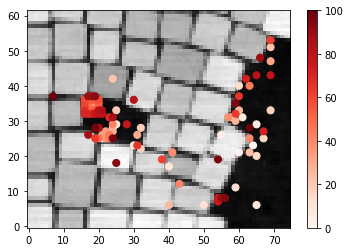

In [33]:
plt.imshow(img, origin="lower", cmap='gray')
plt.scatter(indices_train[2:, 1], indices_train[2:, 0], c=np.arange(len(indices_train[2:])), s=50, cmap="Reds")
plt.colorbar()

Overlay with a 'ground truth':

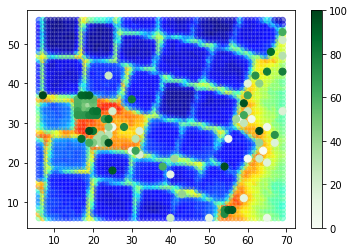

In [34]:
plt.scatter(indices_all[:, 1], indices_all[:, 0], c=peaks_all, cmap='jet', alpha=0.5)
plt.scatter(indices_train[2:, 1], indices_train[2:, 0], c=np.arange(len(indices_train[2:])), s=50, cmap="Greens")
plt.colorbar()

Looks like it did a pretty good job identifying the regions where a physical behavior of intetest is maximized. We note that in addition to the built-in Thompson sampler used here, one can utilize different types of [acquisition functions](https://www.cs.ox.ac.uk/people/nando.defreitas/publications/BayesOptLoop.pdf) for selecting the next measurement points.